## **Experiment No.2 - Visualizing The Cones**
## **(Old Code from Part 1: Slide 3 - Slide 4)**

**Implementation Directly from Part 1** *(w/ minor changes)*


Using digits: [0, 1, 8] | Q = 3 | L = 4
Train samples: 18516
Test samples: 3089
Batch images shape: torch.Size([256, 784])
Batch labels shape: torch.Size([256])
Test batch images shape: torch.Size([256, 784])
Test batch labels shape: torch.Size([256])
TruncationNet(
  (layers): ModuleList(
    (0): Linear(in_features=784, out_features=10, bias=True)
    (1-2): 2 x Linear(in_features=10, out_features=10, bias=True)
    (3): Linear(in_features=10, out_features=3, bias=True)
  )
)
Epoch 1, MSE Loss: 0.2009
Epoch 2, MSE Loss: 0.1638
Epoch 3, MSE Loss: 0.0784
Epoch 4, MSE Loss: 0.0446
Epoch 5, MSE Loss: 0.0328
Epoch 6, MSE Loss: 0.0316
Epoch 7, MSE Loss: 0.0148
Epoch 8, MSE Loss: 0.0269
Epoch 9, MSE Loss: 0.0202
Epoch 10, MSE Loss: 0.0221
Epoch 11, MSE Loss: 0.0186
Epoch 12, MSE Loss: 0.0091
Epoch 13, MSE Loss: 0.0193
Epoch 14, MSE Loss: 0.0222
Epoch 15, MSE Loss: 0.0065
Epoch 16, MSE Loss: 0.0106
Epoch 17, MSE Loss: 0.0050
Epoch 18, MSE Loss: 0.0085
Epoch 19, MSE Loss: 0.0136
Epoch 20, MSE

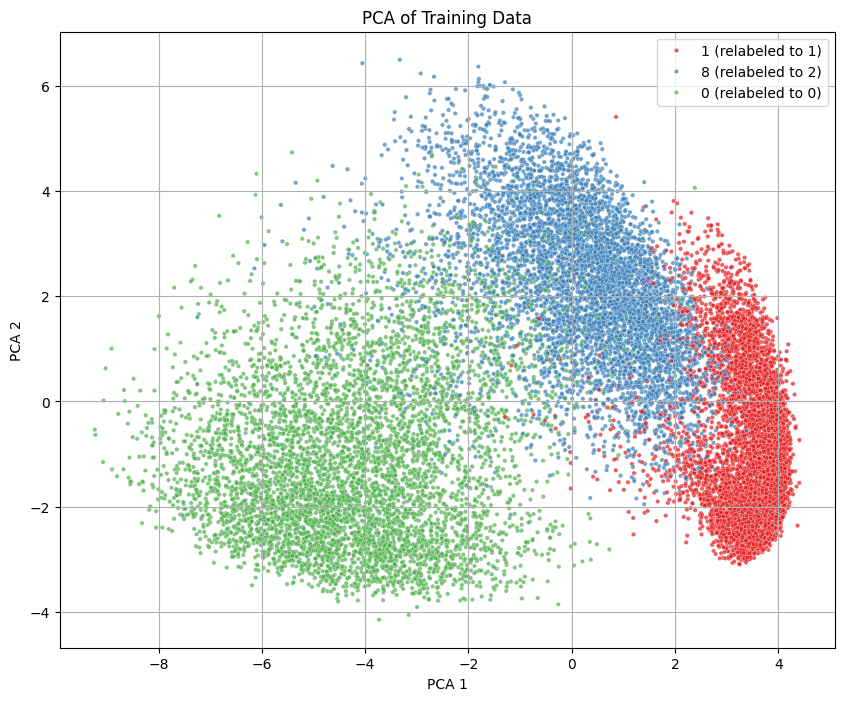

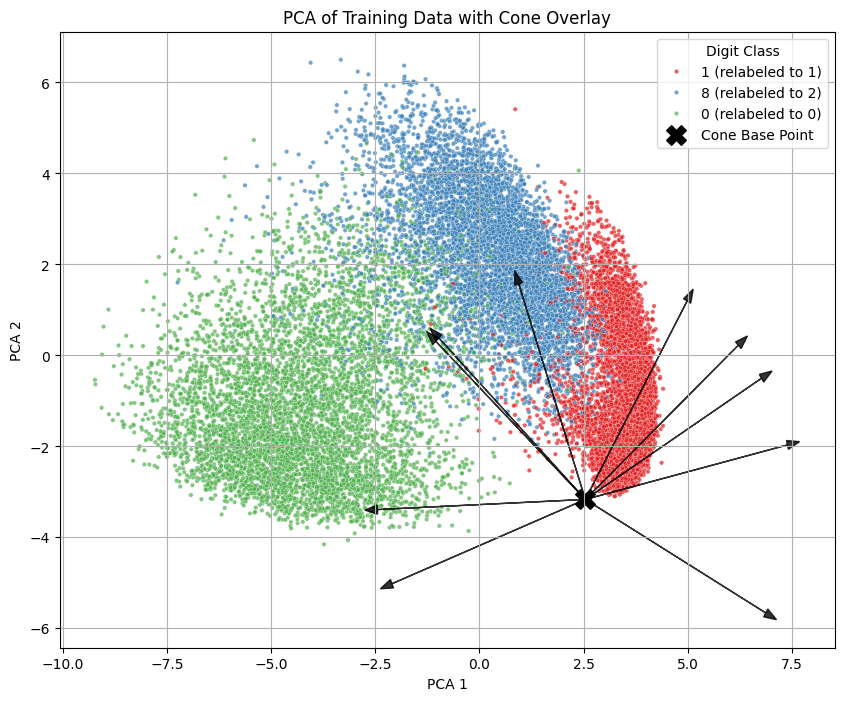

In [ ]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
#Step I - Import Necessarry Dependencies
#-------------------------------------------------------------------------------------------------------------------------------------------------------------

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

import numpy as np
from numpy.linalg import pinv
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
#Step II - Select Digits
#-------------------------------------------------------------------------------------------------------------------------------------------------------------

selected_digits = [0, 1, 8]
Q = len(selected_digits)     # number of classes
L = Q + 1                    # total layers

print(f"Using digits: {selected_digits} | Q = {Q} | L = {L}")

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
#Step III - Preprocess Digits
#-------------------------------------------------------------------------------------------------------------------------------------------------------------

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(-1))  # flatten 28x28 to 784
])

train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)


train_mask = torch.zeros_like(train_dataset.targets, dtype=torch.bool)
test_mask = torch.zeros_like(test_dataset.targets, dtype=torch.bool)


for digit in selected_digits:
    train_mask |= (train_dataset.targets == digit)
    test_mask |= (test_dataset.targets == digit)

# create filters
train_dataset.targets = train_dataset.targets[train_mask]
train_dataset.data    = train_dataset.data[train_mask]
test_dataset.targets = test_dataset.targets[test_mask]
test_dataset.data    = test_dataset.data[test_mask]

# remap labels to {0,...,Q-1}
label_map = {digit: idx for idx, digit in enumerate(selected_digits)}
train_dataset.targets = torch.tensor([label_map[label.item()] for label in train_dataset.targets])
test_dataset.targets = torch.tensor([label_map[label.item()] for label in test_dataset.targets])


train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=256, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=256, shuffle=False)

print(f"Train samples: {len(train_dataset)}")
print(f"Test samples: {len(test_dataset)}")

# confirm size and flattened shape
images, labels = next(iter(train_loader))
print(f"Batch images shape: {images.shape}")
print(f"Batch labels shape: {labels.shape}")
images, labels = next(iter(test_loader))
print(f"Test batch images shape: {images.shape}")
print(f"Test batch labels shape: {labels.shape}")

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
#Task I - Train a Neural Network [based on CE24]
#-------------------------------------------------------------------------------------------------------------------------------------------------------------

# ReLU Feedforward Network
class TruncationNet(nn.Module):
    def __init__(self, input_dim=784, hidden_dims=[10, 10, 10], output_dim=3): # 3 hidden layers (Q) + 1 output layer, should output_dim be 3 or 10?
        super().__init__()
        dims = [input_dim] + hidden_dims + [output_dim]
        self.layers = nn.ModuleList([
            nn.Linear(dims[i], dims[i+1]) for i in range(len(dims)-1)
        ])

    def forward(self, x):
        for layer in self.layers[:-1]:
            x = F.relu(layer(x))
        return self.layers[-1](x)

model = TruncationNet()
print(model)


def one_hot(labels, num_classes):
    return torch.nn.functional.one_hot(labels, num_classes=num_classes).float()

criterion = nn.MSELoss()  # squared L2 loss, matches the paper
optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9)

epochs = 200
for epoch in range(epochs):
    model.train()
    for data, target in train_loader:
        optimizer.zero_grad()

        # One-hot encode the labels
        target_onehot = one_hot(target, num_classes=Q)

        output = model(data)
        loss = criterion(output, target_onehot)

        loss.backward()
        optimizer.step()

    print(f'Epoch {epoch+1}, MSE Loss: {loss.item():.4f}')

print("✅ Training done with MSELoss!")
print(f"Final MSE Loss: {loss.item():.6f}")

# Test accuracy: predict with argmax as usual

model.eval()

correct = 0
total = 0

with torch.no_grad():
    for data, target in test_loader:
        output = model(data)
        pred = output.argmax(dim=1)
        correct += (pred == target).sum().item()
        total += target.size(0)

test_acc = correct / total
print(f"✅ Test Accuracy: {test_acc * 100:.2f}%")

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
#Task II – Determine cumulative parameters  𝑊(ℓ),𝑏(ℓ)
#-------------------------------------------------------------------------------------------------------------------------------------------------------------


# extracting weights and biases
Ws = []
bs = []
for layer in model.layers:
    Ws.append(layer.weight.detach().clone())
    bs.append(layer.bias.detach().clone())

L = len(Ws)  # should equal Q+1
L1 = len(bs) # should equal Q+1

print("Weights Length: ", L)
print("Biases Length: ", L1)

W_cum_chain = []
b_cum_chain = []

for ell in range(L):  # loop through each layer
    if ell == 0:
        # for the first layer, cumulative weight and bias are just themselves
        Wcum = Ws[0]
        bcum = bs[0]
    else:
        # multiply the current layer's weight by the total weight so far
        Wcum = Ws[ell] @ W_cum_chain[-1]

        # for the bias:
        # start at zero, and for each previous bias, multiply it by all the weights that come after it (so they affect how the bias carries forward)
        btemp = 0
        for k in range(ell):
            chain = Ws[ell]
            for j in range(ell-1, k, -1):
                chain = chain @ Ws[j]
            btemp += chain @ bs[k]

        # finally add the current layer's bias
        bcum = btemp + bs[ell]

    print(f"Layer {ell+1}: W_cum shape = {Wcum.shape}, b_cum shape = {bcum.shape}")
    W_cum_chain.append(Wcum) # adds the current layer's cumulative weight to the final array
    b_cum_chain.append(bcum) # adds the current layer's cumulative bias to the final array


#manually checking if the calculated cumulative parameters are correct

# layer 1
W1_manual = Ws[0]
b1_manual = bs[0]

print("\nLayer 1:")
print("W_cum correct?", torch.allclose(W_cum_chain[0], W1_manual, atol=1e-6))
print("b_cum correct?", torch.allclose(b_cum_chain[0], b1_manual, atol=1e-6))

# layer 2
W2_manual = Ws[1] @ Ws[0]
b2_manual = Ws[1] @ bs[0] + bs[1]

print("\nLayer 2:")
print("W_cum correct?", torch.allclose(W_cum_chain[1], W2_manual, atol=1e-6))
print("b_cum correct?", torch.allclose(b_cum_chain[1], b2_manual, atol=1e-6))

# layer 3
W3_manual = Ws[2] @ Ws[1] @ Ws[0]
b3_manual = Ws[2] @ Ws[1] @ bs[0] + Ws[2] @ bs[1] + bs[2]

print("\nLayer 3:")
print("W_cum correct?", torch.allclose(W_cum_chain[2], W3_manual, atol=1e-6))
print("b_cum correct?", torch.allclose(b_cum_chain[2], b3_manual, atol=1e-6))

# layer 4
W4_manual = Ws[3] @ Ws[2] @ Ws[1] @ Ws[0]
b4_manual = Ws[3] @ Ws[2] @ Ws[1] @ bs[0] + Ws[3] @ Ws[2] @ bs[1] + Ws[3] @ bs[2] + bs[3]

print("\nLayer 4:")
print("W_cum correct?", torch.allclose(W_cum_chain[3], W4_manual, atol=1e-6))
print("b_cum correct?", torch.allclose(b_cum_chain[3], b4_manual, atol=1e-6))

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
#Task III – Determine cones
#-------------------------------------------------------------------------------------------------------------------------------------------------------------

def compute_cones(W_cum, b_cum, residual_tol=1e-4):
    cones = []
    for ell, (W, b) in enumerate(zip(W_cum, b_cum)):

        # making sure everything is pure NumPy (got warning before)
        if hasattr(W, 'detach'): W = W.detach().cpu().numpy()
        if hasattr(b, 'detach'): b = b.detach().cpu().numpy()

        # compute the pseudoinverse of W
        W_pinv = np.linalg.pinv(W)

        # compute base point: p = - W^+ b [Ewa25]
        p = -W_pinv @ b

        # compute edges: v_i = W^+ e_i for standard basis vectors e_i [Ewa25]
        m = W.shape[0]
        edges = []
        edge_residuals = []

        for i in range(m):
            ei = np.zeros(m)
            ei[i] = 1
            vi = W_pinv @ ei
            edges.append(vi)

            residual = np.linalg.norm(W @ vi - ei)
            edge_residuals.append(residual)

        cones.append({'base': p, 'edges': edges})

        print(f"\n=== Layer {ell+1} Cone Checks ===")

        # Surjectivity check (Lemma 2.1)
        rank = np.linalg.matrix_rank(W)
        rows, cols = W.shape
        print(f"Rank(W) = {rank} | Should be full row rank = {rows}")
        if rank == rows:
            print("✅ Surjective check passed, it is full row rank")
        else:
            print("⚠️ Not surjective")

        # Base point residual check
        base_residual = np.linalg.norm(W @ p + b)
        if base_residual <= residual_tol:
            print(f"✅ Base point residual ||Wp + b|| = {base_residual:.2e} (OK)")
        else:
            print(f"⚠️ Base point residual ||Wp + b|| = {base_residual:.2e} exceeds tolerance")

        # Edge residuals check
        edge_residuals = np.array(edge_residuals)
        num_failed_edges = np.sum(edge_residuals > residual_tol)
        mean_edge_residual = np.mean(edge_residuals)

        if num_failed_edges == 0:
          print(f"✅ All edge checks passed | Failing: {num_failed_edges}/{m} | Mean residual: {mean_edge_residual:.2e}")
        else:
          print(f"⚠️ Some edge residuals exceed tolerance | Failing: {num_failed_edges}/{m} | Mean residual: {mean_edge_residual:.2e}")

        print(f"------------------")

        # Overall pass/fail summary
        if rank == rows and base_residual <= residual_tol and num_failed_edges == 0:
            print("✅ Lemma 2.1 conditions are met")
        else:
            print("⚠️ Lemma 2.1 conditions are not met")

    return cones

cones = compute_cones(W_cum_chain, b_cum_chain)

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
#Task IV – PCA Visualization for Cones and Data
#-------------------------------------------------------------------------------------------------------------------------------------------------------------

# Step 1

X_train = []
y_train = []

for batch, labels in train_loader:
    X_train.append(batch)
    y_train.append(labels)

X_train = torch.cat(X_train, dim=0).numpy()
y_train = torch.cat(y_train, dim=0).numpy()

# Step 2

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)

# Step 3

# create a mapping like: "1 (relabeled to 0)" to make plot easier to read
inv_map = {v: k for k, v in label_map.items()}
label_names = [f"{inv_map[y]} (relabeled to {y})" for y in y_train]

df = pd.DataFrame({
    "PCA1": X_train_pca[:, 0],
    "PCA2": X_train_pca[:, 1],
    "Label": label_names
})

plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=df,
    x=X_train_pca[:, 0],
    y=X_train_pca[:, 1],
    hue="Label",
    palette='Set1',
    s=10,
    alpha=0.7
)

plt.title("PCA of Training Data")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.grid(True)
plt.show()

# Step 4

cone = cones[0]
p = cone['base']    # base point, shape [784]
edges = cone['edges']  # list of v_i

# Step 5

p_proj = pca.transform(p.reshape(1, -1)).flatten()


# Step 6

edges_proj = [] # projected endpoints
for vi in edges:
    vi_proj = pca.transform(vi.reshape(1, -1)).flatten()  # [2]
    edges_proj.append(vi_proj)

edges_dirs = [vi_proj - p_proj for vi_proj in edges_proj] #projected direction vectors relative to the base, this is needed for plt.arrow

# Step 7

plt.figure(figsize=(10, 8))

# Scatter plot of PCA training data points
sns.scatterplot(
    data=df,
    x="PCA1",
    y="PCA2",
    hue="Label",
    palette='Set1',
    s=10,
    alpha=0.7
)

# Plot base point
plt.scatter(
    p_proj[0], p_proj[1],
    marker='X', s=200, color='black',
    label='Cone Base Point'
)

# Plot edges as arrows
for dir_proj in edges_dirs:
    norm = np.linalg.norm(dir_proj)
    if norm > 0:
        scaled_dir = dir_proj / norm * 5  # adjust scale for visibility
        plt.arrow(
            p_proj[0], p_proj[1],
            scaled_dir[0], scaled_dir[1],
            head_width=0.2, head_length=0.3,
            color='black', alpha=0.8
        )

plt.title("PCA of Training Data with Cone Overlay")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend(title="Digit Class")
plt.grid(True)
plt.show()

## **Experiment No.2 - Visualizing the Data Changing Through The Layers**
## **(Beginning of New Code: Slide 5 - Slide 14)**

**Suggestions Before I Start (Slide 5):**



- No need to compute the a(i) components; compute truncated data points directly using the truncation map definition and cumulative parameters.

- For plots:
  - Do PCA on the original training data to get principal components.
  - Use those same principal components to project the truncated data.

- For Q = 3 classes, make 4 plots:
  1. One plot of the original data projected to 2D.
  2. Three plots for the truncated data using τ_{W^{(ℓ)}, b^{(ℓ)}} for ℓ = 1, 2, 3, projected to 2D.

- You can also experiment with alternative projections (e.g., PCA on each truncated dataset or projections to the class means).

- Also plot the final network output in ℝ^Q; for Q = 3, this requires no dimensionality reduction.
<br>
----




> **Notes that I took on the equations used throughout this Experiment on ReLU Cone Geometry.** This helped me code and visualize the transition of data through the layers.



<img src="https://drive.google.com/uc?export=view&id=1IVIqrGZZa9c_KC5HxC6N79LbwAmHIyyt" width="450">

<img src="https://drive.google.com/uc?export=view&id=12FyWIZ1K0lOyo7MJ_87BGoPfciFmnOzZ" width="431">


---

* (1) **Perform PCA ONLY on the Original Training Data and Transform the Truncated Dataset (Global PCA)**
* **Slide 6 - Slide 7**

Truncated data for layer 1: (18516, 784)
Truncated data for layer 2: (18516, 784)
Truncated data for layer 3: (18516, 784)


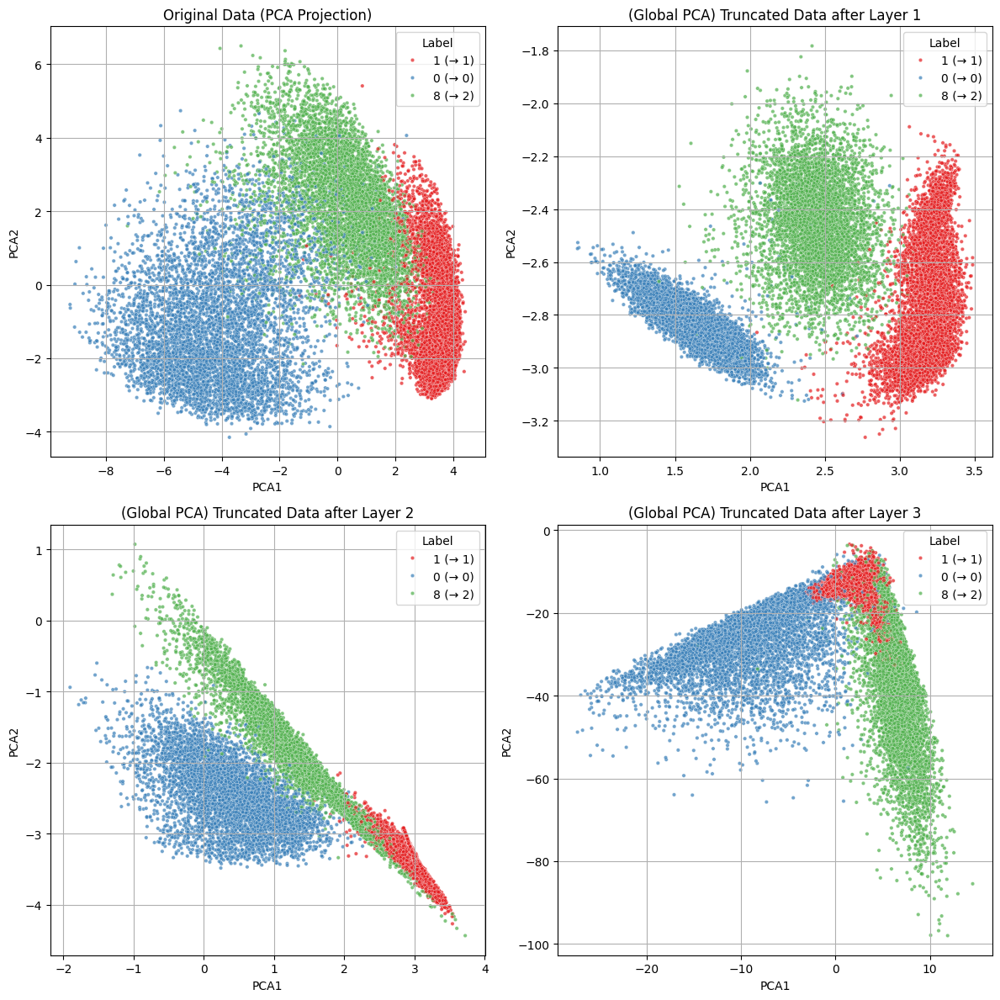

Output layer shape: (18516, 3)


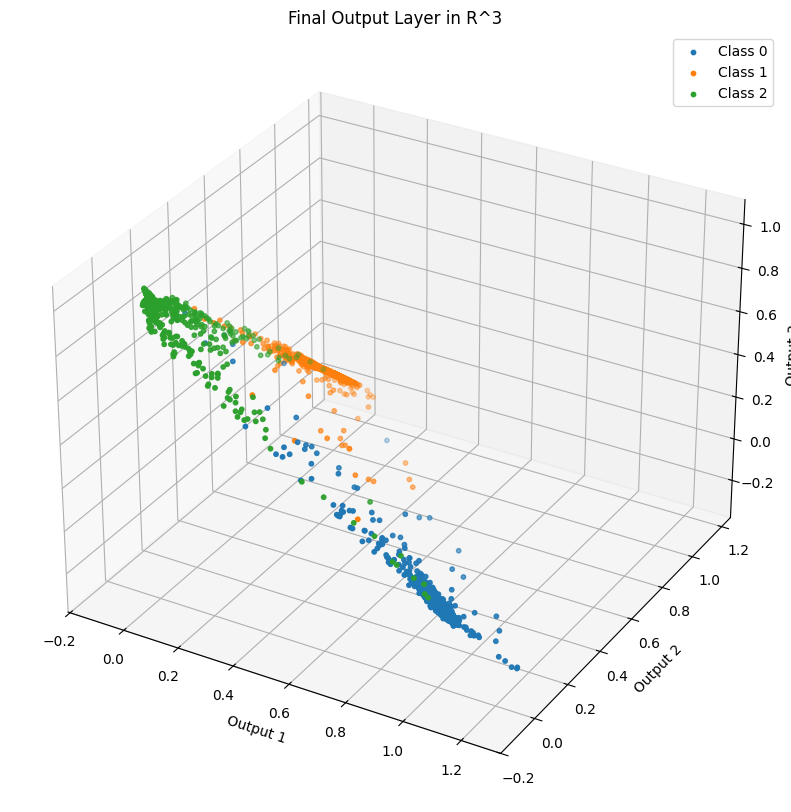

In [ ]:
# ---------------------------------------------------------
# Prepare full training data as one big matrix
# ---------------------------------------------------------
X_train = []
y_train = []

for batch, labels in train_loader:
    X_train.append(batch)
    y_train.append(labels)

X_train = torch.cat(X_train, dim=0).numpy()
y_train = torch.cat(y_train, dim=0).numpy()

# ---------------------------------------------------------
# Do PCA on original data
# ---------------------------------------------------------
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)

# For label coloring
inv_map = {v: k for k, v in label_map.items()} # Reverse the label_map so you can get original names from indices
label_names = [f"{inv_map[y]} (→ {y})" for y in y_train] # Make a readable label name for each data point, e.g., "8 (→ 0)"

# ---------------------------------------------------------
# Setting up to plot original data + truncated data in 2x2 grid
# ---------------------------------------------------------

fig, axes = plt.subplots(2, 2, figsize=(12, 12))  # 2 row, 2 columns (this is for making sure all truncation plots can be viewed together)
axes = axes.flatten()  # flatten for easy indexing

# Original data
df = pd.DataFrame({
    "PCA1": X_train_pca[:, 0],
    "PCA2": X_train_pca[:, 1],
    "Label": label_names
})
sns.scatterplot(
    data=df, x="PCA1", y="PCA2", hue="Label",
    palette='Set1', s=10, alpha=0.7, ax=axes[0]
)
axes[0].set_title("Original Data (PCA Projection)")
axes[0].grid(True)

# ---------------------------------------------------------
# Compute truncated data using truncation map definition (please refer to below this cell's output to notes that I took to understand the derivation of a truncation map!)
# ---------------------------------------------------------

X_trunc_chain = []  # List to store truncated data for each layer

for ell in range(Q):
    # Get cumulative parameters for layer ell: W^(ell) and b^(ell)
    Wcum = W_cum_chain[ell].detach().cpu().numpy()
    bcum = b_cum_chain[ell].detach().cpu().numpy()

    # Compute pseudoinverse of W^(ell)
    W_pinv = np.linalg.pinv(Wcum)

    # Compute pre-activation: Z = X * W^T + b
    Z = X_train @ Wcum.T + bcum

    # Apply ReLU nonlinearity: max(0, Z)
    Z_relu = np.maximum(Z, 0)

    # Apply truncation map definition:
    # τ_{W,b}(x) = W^(-1) (ReLU(Wx + b) - b)
    X_trunc = (W_pinv @ (Z_relu.T - bcum[:, np.newaxis])).T

    # Store truncated data for this layer
    X_trunc_chain.append(X_trunc)

    # Print shape for confirmation
    print(f"Truncated data for layer {ell+1}: {X_trunc.shape}")

# ---------------------------------------------------------
# Project truncated data in same PCA frame & plot (2x2 grid)
# ---------------------------------------------------------

for ell, X_trunc in enumerate(X_trunc_chain):
    X_pca = pca.transform(X_trunc)
    df_trunc = pd.DataFrame({
        "PCA1": X_pca[:, 0],
        "PCA2": X_pca[:, 1],
        "Label": label_names
    })
    sns.scatterplot(
        data=df_trunc, x="PCA1", y="PCA2",
        hue="Label", palette='Set1', s=10, alpha=0.7, ax=axes[ell+1]
    )
    axes[ell+1].set_title(f"(Global PCA) Truncated Data after Layer {ell+1}")
    axes[ell+1].grid(True)

plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# Plot final output in R^Q (no PCA needed)
# ---------------------------------------------------------

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
model.eval() # Set model to evaluation mode and disable gradients
with torch.no_grad():
    X_out = model(X_train_tensor).numpy() # Forward pass to get final output logits

print(f"Output layer shape: {X_out.shape}")

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
for c in np.unique(y_train): # Loop through each class to plot its points
    idx = y_train == c
    ax.scatter(
        X_out[idx, 0], X_out[idx, 1], X_out[idx, 2],
        label=f"Class {c}", s=10
    )

ax.set_title("Final Output Layer in R^3")
ax.set_xlabel("Output 1")
ax.set_ylabel("Output 2")
ax.set_zlabel("Output 3")
ax.legend()
plt.show()

Moving on to the next part of this project, Patrícia said:
> **You can also experiment with alternative projections (e.g., PCA on each truncated dataset or projections to the class means).**
<br>

---


* **(2) Perform PCA Separately on Each Truncated Subset (Local PCA)**
* **Slide 8 - Slide 9**

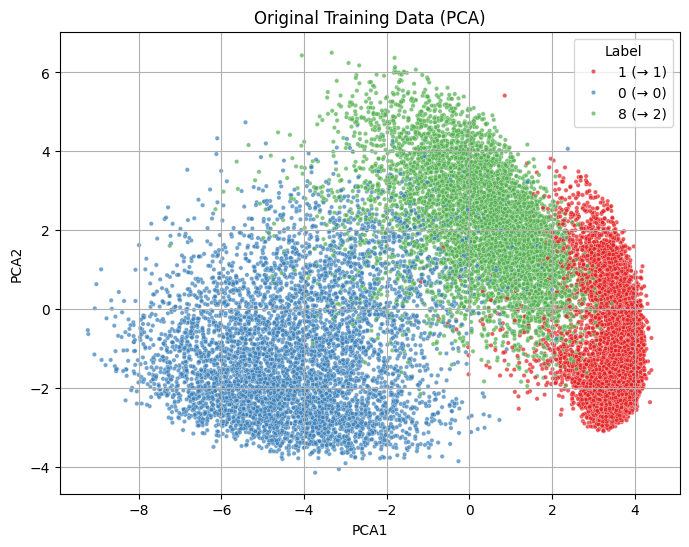

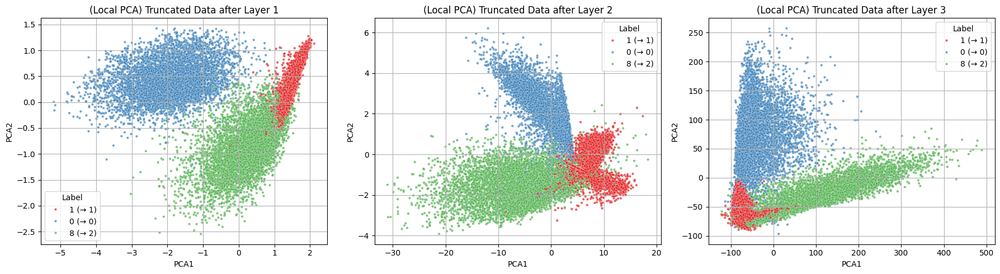

In [ ]:
# ---------------------------------------------------------
# Prepare full training data as one big matrix
# ---------------------------------------------------------
X_train = []
y_train = []

for batch, labels in train_loader:
    X_train.append(batch)
    y_train.append(labels)

X_train = torch.cat(X_train, dim=0).numpy()
y_train = torch.cat(y_train, dim=0).numpy()

# For label coloring
inv_map = {v: k for k, v in label_map.items()} # Reverse the label_map so you can get original names from indices
label_names = [f"{inv_map[y]} (→ {y})" for y in y_train] # Make a readable label name for each data point, e.g., "8 (→ 0)"

# ---------------------------------------------------------
# Global PCA on original training data
# ---------------------------------------------------------

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)

plt.figure(figsize=(8, 6))
df_orig = pd.DataFrame({
    "PCA1": X_train_pca[:, 0],
    "PCA2": X_train_pca[:, 1],
    "Label": label_names
})
sns.scatterplot(
    data=df_orig, x="PCA1", y="PCA2",
    hue="Label", palette='Set1', s=10, alpha=0.7
)
plt.title("Original Training Data (PCA)")
plt.grid(True)
plt.show()

# ---------------------------------------------------------
# Compute truncated data
# ---------------------------------------------------------

X_trunc_chain = []  # List to store truncated data for each layer

for ell in range(Q):
    # Get cumulative parameters for layer ell: W^(ell) and b^(ell)
    Wcum = W_cum_chain[ell].detach().cpu().numpy()
    bcum = b_cum_chain[ell].detach().cpu().numpy()

    # Compute pseudoinverse of W^(ell)
    W_pinv = np.linalg.pinv(Wcum)

    # Compute pre-activation: Z = X * W^T + b
    Z = X_train @ Wcum.T + bcum

    # Apply ReLU nonlinearity: max(0, Z)
    Z_relu = np.maximum(Z, 0)

    # Apply truncation map definition:
    # τ_{W,b}(x) = W^(-1) (ReLU(Wx + b) - b)
    X_trunc = (W_pinv @ (Z_relu.T - bcum[:, np.newaxis])).T

    # Store truncated data for this layer
    X_trunc_chain.append(X_trunc)

    # Print shape for confirmation
    #print(f"Truncated data for layer {ell+1}: {X_trunc.shape}")

# ---------------------------------------------------------
# Local PCA on each truncated dataset
# ---------------------------------------------------------
fig, axes = plt.subplots(1, Q, figsize=(6 * Q, 5))
if Q == 1:
    axes = [axes]

for ell, X_trunc in enumerate(X_trunc_chain):
    local_pca = PCA(n_components=2)
    X_trunc_pca = local_pca.fit_transform(X_trunc)

    df_trunc_local = pd.DataFrame({
        "PCA1": X_trunc_pca[:, 0],
        "PCA2": X_trunc_pca[:, 1],
        "Label": label_names
    })

    sns.scatterplot(
        data=df_trunc_local, x="PCA1", y="PCA2",
        hue="Label", palette='Set1', s=10, alpha=0.7, ax=axes[ell]
    )
    axes[ell].set_title(f"(Local PCA) Truncated Data after Layer {ell+1}")
    axes[ell].grid(True)

plt.tight_layout()
plt.show()


* **(3) Project Each Truncated Subset onto Class Mean-Difference Directions (Barycentric Projection)**
* **Slide 10 - Slide 11**

> Before moving forward with coding the **barycentric projection algorithm**, I derived the full mean-difference equations to ensure there would be no mathematical errors in the implementation.



<img src="https://drive.google.com/uc?id=1HydjFwXtmYc47FL0KG_TMGil3iKCHsmx" width="600">

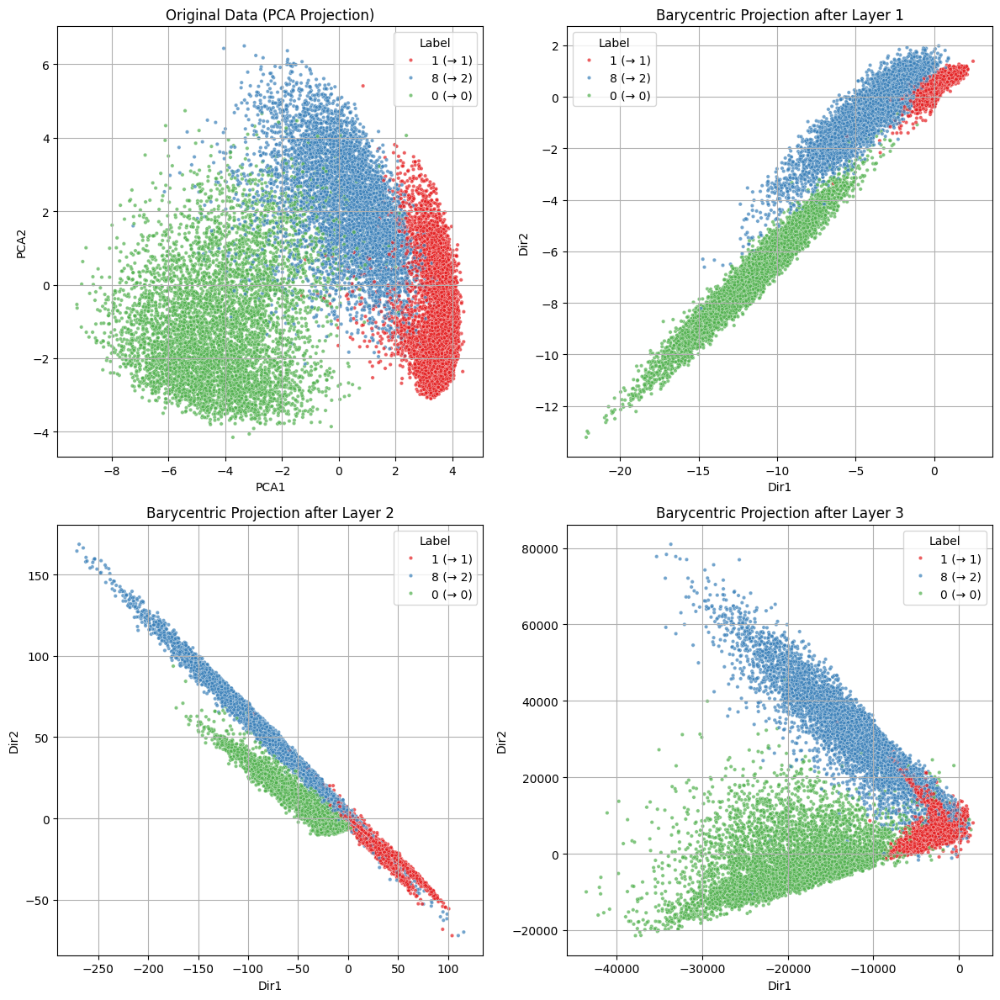

In [ ]:
# ---------------------------------------------------------
# Prepare full training data as one big matrix
# ---------------------------------------------------------
X_train = []
y_train = []

for batch, labels in train_loader:
    X_train.append(batch)
    y_train.append(labels)

X_train = torch.cat(X_train, dim=0).numpy()
y_train = torch.cat(y_train, dim=0).numpy()

# For label coloring
inv_map = {v: k for k, v in label_map.items()}  # Reverse the label_map so you can get original names from indices
label_names = [f"{inv_map[y]} (→ {y})" for y in y_train] # Make a readable label name for each data point, e.g., "8 (→ 0)"


# ---------------------------------------------------------
# Global PCA on original data (optional baseline for comparison)
# ---------------------------------------------------------
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)

# ---------------------------------------------------------
# Setting up to plot original + barycentric-projected truncated data in 2x2 grid
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

# Original data in Global PCA
df_orig = pd.DataFrame({
    "PCA1": X_train_pca[:, 0],
    "PCA2": X_train_pca[:, 1],
    "Label": label_names
})
sns.scatterplot(
    data=df_orig, x="PCA1", y="PCA2",
    hue="Label", palette='Set1', s=10, alpha=0.7, ax=axes[0]
)
axes[0].set_title("Original Data (PCA Projection)")
axes[0].grid(True)

# ---------------------------------------------------------
# Compute truncated data using truncation map definition
# ---------------------------------------------------------

X_trunc_chain = []  # List to store truncated data for each layer

for ell in range(Q):
    # Get cumulative parameters for layer ell: W^(ell) and b^(ell)
    Wcum = W_cum_chain[ell].detach().cpu().numpy()
    bcum = b_cum_chain[ell].detach().cpu().numpy()

    # Compute pseudoinverse of W^(ell)
    W_pinv = np.linalg.pinv(Wcum)

    # Compute pre-activation: Z = X * W^T + b
    Z = X_train @ Wcum.T + bcum

    # Apply ReLU nonlinearity: max(0, Z)
    Z_relu = np.maximum(Z, 0)

    # Apply truncation map definition:
    # τ_{W,b}(x) = W^(-1) (ReLU(Wx + b) - b)
    X_trunc = (W_pinv @ (Z_relu.T - bcum[:, np.newaxis])).T

    # Store truncated data for this layer
    X_trunc_chain.append(X_trunc)

    # Print shape for confirmation
    #print(f"Truncated data for layer {ell+1}: {X_trunc.shape}")


# ---------------------------------------------------------
# Project each truncated dataset using barycentric projection
# ---------------------------------------------------------

class_labels = np.unique(y_train)

for ell, X_trunc in enumerate(X_trunc_chain):
    # 1) Compute mean vector for each class in truncated data
    means = []
    for c in class_labels:
        means.append(X_trunc[y_train == c].mean(axis=0))  # shape: (d,)
    means = np.vstack(means)  # shape: (C, d)

    # 2) Choose reference mean (e.g., class 0)
    ref = means[0]

    # 3) Form mean-difference directions: w_c = μ_c - μ_ref
    W_proj = []
    for i in range(1, len(means)):
        W_proj.append(means[i] - ref)
    W_proj = np.vstack(W_proj).T  # shape: (d, C-1)

    # 4) Project each data point: z_i = x_i ⋅ W_proj
    X_proj = X_trunc @ W_proj  # shape: (N, C-1)

    # 5) If only 1 direction, pad to 2D for plotting
    if X_proj.shape[1] == 1:
        X_proj = np.hstack([X_proj, np.zeros_like(X_proj)])

    # 6) Plot projected data in mean-difference coordinates
    df_bary = pd.DataFrame({
        "Dir1": X_proj[:, 0],
        "Dir2": X_proj[:, 1],
        "Label": label_names
    })
    sns.scatterplot(
        data=df_bary, x="Dir1", y="Dir2",
        hue="Label", palette='Set1', s=10, alpha=0.7, ax=axes[ell+1]
    )
    axes[ell+1].set_title(f"Barycentric Projection after Layer {ell+1}")
    axes[ell+1].grid(True)

plt.tight_layout()
plt.show()

And finally... as I researched alternate projection methods, I realized that LDA might be especially helpful because it is supervised and directly finds directions that maximize class separability.


* **(4) Perform LDA ONLY on the Original Training Data and Transform the Truncated Dataset (Global LDA)**
* **Slide 12 - Slide 13**

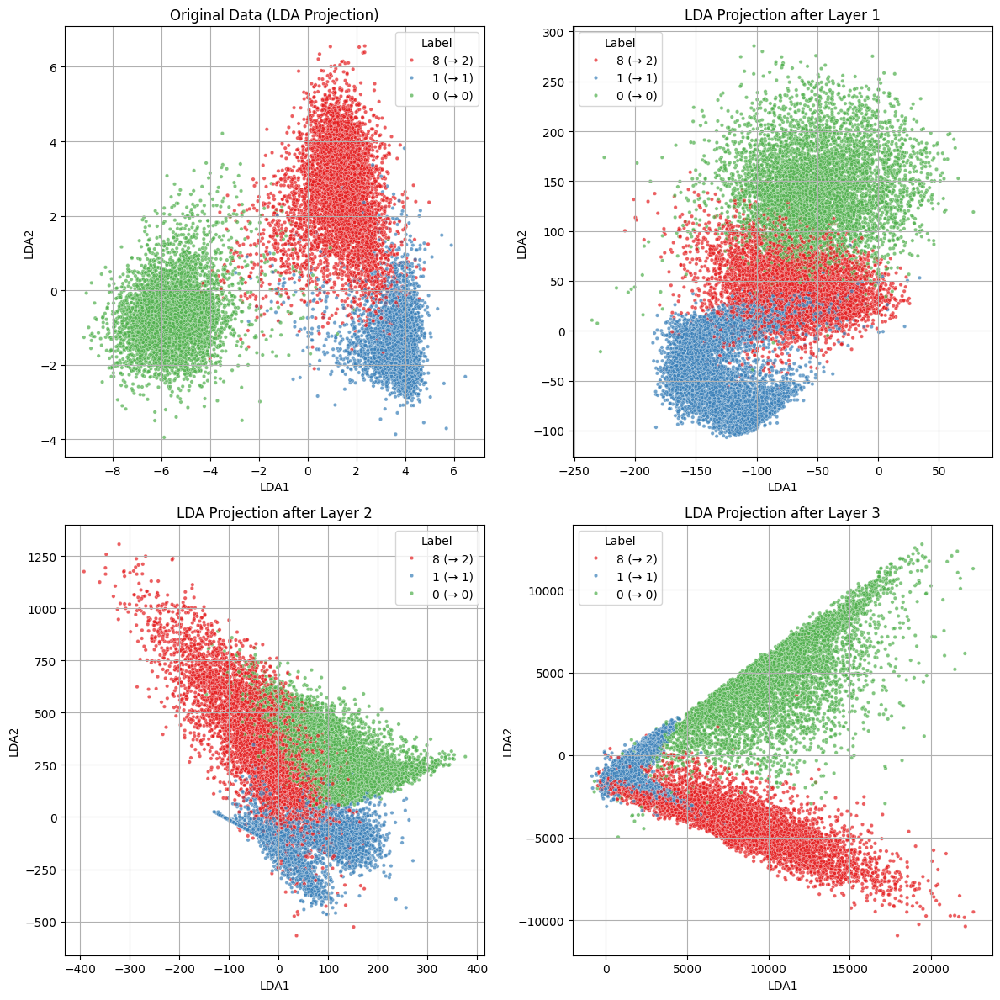

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# ---------------------------------------------------------
# Fit LDA on original training data
# ---------------------------------------------------------
lda = LDA(n_components=2)
X_train_lda = lda.fit_transform(X_train, y_train)

# ---------------------------------------------------------
# Set up plot grid: Original + each layer in same LDA basis
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

# ---------------------------------------------------------
# Plot original data in LDA space
# ---------------------------------------------------------
df_orig_lda = pd.DataFrame({
    "LDA1": X_train_lda[:, 0],
    "LDA2": X_train_lda[:, 1],
    "Label": label_names
})
sns.scatterplot(
    data=df_orig_lda, x="LDA1", y="LDA2",
    hue="Label", palette='Set1', s=10, alpha=0.7, ax=axes[0]
)
axes[0].set_title("Original Data (LDA Projection)")
axes[0].grid(True)


# ---------------------------------------------------------
# Compute truncated data using truncation map definition
# ---------------------------------------------------------

X_trunc_chain = []  # List to store truncated data for each layer

for ell in range(Q):
    # Get cumulative parameters for layer ell: W^(ell) and b^(ell)
    Wcum = W_cum_chain[ell].detach().cpu().numpy()
    bcum = b_cum_chain[ell].detach().cpu().numpy()

    # Compute pseudoinverse of W^(ell)
    W_pinv = np.linalg.pinv(Wcum)

    # Compute pre-activation: Z = X * W^T + b
    Z = X_train @ Wcum.T + bcum

    # Apply ReLU nonlinearity: max(0, Z)
    Z_relu = np.maximum(Z, 0)

    # Apply truncation map definition:
    # τ_{W,b}(x) = W^(-1) (ReLU(Wx + b) - b)
    X_trunc = (W_pinv @ (Z_relu.T - bcum[:, np.newaxis])).T

    # Store truncated data for this layer
    X_trunc_chain.append(X_trunc)

    # Print shape for confirmation
    #print(f"Truncated data for layer {ell+1}: {X_trunc.shape}")

# ---------------------------------------------------------
# Project each truncated dataset using same LDA transform
# ---------------------------------------------------------
for ell, X_trunc in enumerate(X_trunc_chain):
    X_trunc_lda = lda.transform(X_trunc)

    # If only 1 direction, pad to 2D for consistent plotting
    if X_trunc_lda.shape[1] == 1:
        X_trunc_lda = np.hstack([X_trunc_lda, np.zeros_like(X_trunc_lda)])

    df_trunc_lda = pd.DataFrame({
        "LDA1": X_trunc_lda[:, 0],
        "LDA2": X_trunc_lda[:, 1],
        "Label": label_names
    })
    sns.scatterplot(
        data=df_trunc_lda, x="LDA1", y="LDA2",
        hue="Label", palette='Set1', s=10, alpha=0.7, ax=axes[ell+1]
    )
    axes[ell+1].set_title(f"LDA Projection after Layer {ell+1}")
    axes[ell+1].grid(True)

plt.tight_layout()
plt.show()

## **Experiment No.2 - Implementation with Synthetic Data**
## **(New Code Continued: Slide 15 - Slide 27)**

***(So it’s more of a study on cones and truncation maps rather than MNIST) - Slide 15***

- **Goal:** Generate simple synthetic data in **ℝ³** to train a ReLU network and **visualize cones & truncation maps** clearly.

- **Why:** Low dimension means **no projection loss**, so geometry is easy to see.

- **Where Do I Start?:**
  - Use **Q = 3 classes**, each cluster well-separated.
  - **Example:**
    - 3 spheres/balls centered at **(1,0,0)**, **(0,1,0)**, **(0,0,1)**.
    - Or use **Gaussian mixture model** with small standard deviation.

- **Optional variations:**
  - 3 classes that are **SLS** but not clustered.
  - 2 classes **not linearly separable**, but **not concentric** (like Fig 1a in [Ewa25]).
  - 2 classes that are **concentric** (like Fig 1b in [Ewa25]).

- **Next step:** Train, extract **cumulative parameters**, plot **cones & truncations** just like for MNIST.
<br>
----


**Step No.1 - Generate Different Types of Synthetic Data**

In [ ]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Import Necessarry Dependencies
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
from numpy.linalg import pinv
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # For 3D plots
import seaborn as sns
import pandas as pd
import random
from sklearn.svm import LinearSVC

> **Synthetic Dataset Type (a) - Gaussian Mixture Model**
> * **Slide 16**

DATA: Using synthetic classes: [0, 1, 2] | Q = 3 | L = 4 

----------- VISUALIZING THE GENERATED SYNTHETIC DATA -----------



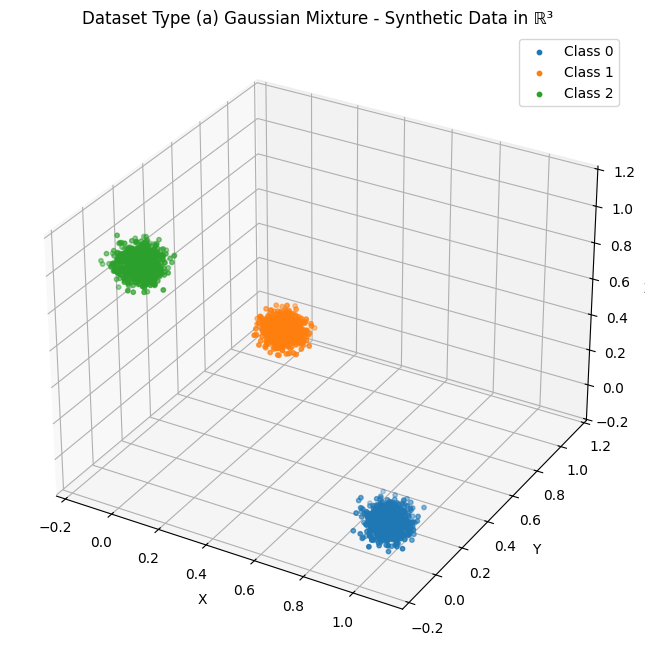

In [ ]:
def generate_gaussian_mixture_data():
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Select Digits
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    selected_digits = [0, 1, 2]  # For synthetic data, treat them as class labels
    Q = len(selected_digits)     # number of classes
    L = Q + 1                    # total layers

    print(f"DATA: Using synthetic classes: {selected_digits} | Q = {Q} | L = {L} \n")

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Create Synthetic Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    # Create synthetic data: 3 well-separated 3D Gaussian blobs
    X, y = make_blobs(
        n_samples=3000,
        centers=[
            [1.0, 0.0, 0.0],
            [0.0, 1.0, 0.0],
            [0.0, 0.0, 1.0]
        ],
        cluster_std=0.04,
        n_features=3,
        random_state=42
    )

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Preprocess Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    from sklearn.model_selection import train_test_split
    import torch
    from torch.utils.data import TensorDataset, DataLoader

    # Split into train/test
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=42
    )

    # Convert to torch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    X_test_tensor  = torch.tensor(X_test, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_test_tensor  = torch.tensor(y_test, dtype=torch.long)

    # Create TensorDatasets and DataLoaders
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    test_dataset  = TensorDataset(X_test_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader  = DataLoader(test_dataset, batch_size=64, shuffle=False)

    # Prepare flat data and labels for SLS experiment
    x_train_flat = X_train.copy()
    y_train_subset = y_train.copy()

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Visualize Generated Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print('----------- VISUALIZING THE GENERATED SYNTHETIC DATA -----------\n')

    import numpy as np
    import matplotlib.pyplot as plt

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    colors = ['r', 'g', 'b']
    for c in np.unique(y_train):
        idx = y_train == c
        ax.scatter(
            X_train[idx, 0],
            X_train[idx, 1],
            X_train[idx, 2],
            label=f'Class {c}',
            s=10
        )

    ax.set_title('Dataset Type (a) Gaussian Mixture - Synthetic Data in ℝ³')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend()
    plt.show()

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    return {
        'Q': Q,
        'X': X, 'y': y,
        'X_train': X_train, 'y_train': y_train,
        'train_loader': train_loader,
        'test_loader': test_loader
    }

_ = generate_gaussian_mixture_data()

> **NOTE: Before implementing the next dataset type, I’m bringing my SLS code from Experiment #1 so I can verify whether the dataset I’ve generated is Sequentially Linearly Separable (SLS).**


In [ ]:
def run_sls_analysis(x_train_flat, y_train_subset, selected_digits, strict_threshold=0.04):
    print("\n----------- STRICT SLS TEST RESULTS -----------\n")
    # Step 1: Compute class means and barycenter
    class_means = {}
    for label in np.unique(y_train_subset):
        class_images = x_train_flat[y_train_subset == label]
        mean_vector = np.mean(class_images, axis=0)
        class_means[label] = mean_vector

    means_stack = np.stack([class_means[cls] for cls in selected_digits])
    barycenter = np.mean(means_stack, axis=0)

    # Step 2: Define and run SLS experiment
    def sls_experiment(strict=True, error_threshold=strict_threshold):
        x_mod = x_train_flat.copy()
        y_mod = y_train_subset.copy()

        separation_results = {}
        misclassified_counts = {}
        class_means_copy = class_means.copy()
        pn_points = {}
        error_rate_dict = {}

        for n in selected_digits:
            if len(np.unique(y_mod)) == 1:
              separation_results[n] = True
              misclassified_counts[n] = 0
              error_rate_dict[n] = 0
              if strict:
                  print(f"Class {n} Separation Error Rate: 0% - Only Class Left")
              continue

            y_binary = np.where(y_mod == n, 1, -1)
            clf = LinearSVC(C=1.0, max_iter=10000)
            clf.fit(x_mod, y_binary)

            preds = clf.predict(x_mod)
            error_rate = np.mean(preds[y_binary == 1] != 1)

            is_perfect = error_rate == 0.0
            separation_results[n] = is_perfect
            misclassified_counts[n] = np.sum(preds != y_binary)
            error_rate_dict[n] = error_rate

            if strict:
                print(f"Class {n} Separation Error Rate: {error_rate*100:.2f}%")

            if not is_perfect and (strict or error_rate > error_threshold):
                break

            w = clf.coef_[0]
            b = clf.intercept_[0]
            direction = barycenter - class_means_copy[n]
            t = -(np.dot(w, class_means_copy[n]) + b) / np.dot(w, direction)
            p_n = class_means_copy[n] + t * direction
            pn_points[n] = p_n

            x_mod[y_mod == n] = p_n
            keep_mask = y_mod != n
            x_mod = x_mod[keep_mask]
            y_mod = y_mod[keep_mask]

        return separation_results, misclassified_counts, error_rate_dict, error_threshold, pn_points

    # Step 3: Run and visualize
    results_strict, errors_strict, error_rate_dict_strict, _, _ = sls_experiment(strict=True)
    results_relaxed, errors_relaxed, error_rate_dict_relaxed, error_threshold, pn_points = sls_experiment(strict=False)

    if all(results_strict.values()):
        print("\n- ✅ DATASET IS SLS UNDER STRICT CONDITIONS.")
    else:
        print("\n❌ Dataset is NOT SLS under strict conditions.")

    processed_classes_strict = list(error_rate_dict_strict.keys())
    processed_classes_relaxed = list(error_rate_dict_relaxed.keys())
    errors_strict_pct = [error_rate_dict_strict[d] * 100 for d in processed_classes_strict]
    errors_relaxed_pct = [error_rate_dict_relaxed[d] * 100 for d in processed_classes_relaxed]
    error_threshold_pct = error_threshold * 100

> **Synthetic Dataset Type (b) - SLS Non-Clustered Dataset**
> * **Slide 17**

DATA: Using synthetic classes: [0, 1, 2] | Q = 3 | L = 4 

----------- VISUALIZING THE GENERATED SYNTHETIC DATA -----------



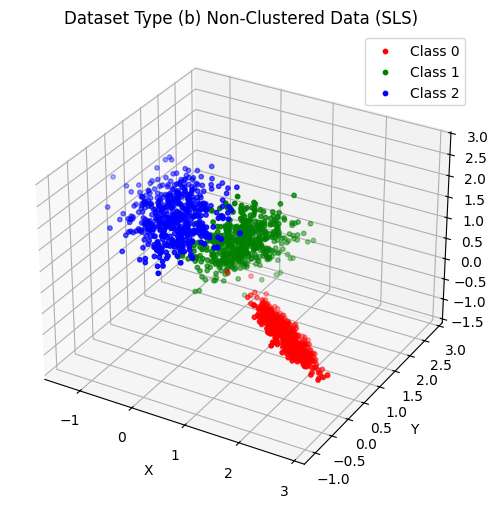


----------- STRICT SLS TEST RESULTS -----------

Class 0 Separation Error Rate: 0.25%

❌ Dataset is NOT SLS under strict conditions.
-----------------------------------------------


In [ ]:
def generate_non_clustered_sls_data():
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Select Digits
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    selected_digits = [0, 1, 2]  # For synthetic data, treat them as class labels
    Q = len(selected_digits)     # number of classes
    L = Q + 1                    # total layers

    print(f"DATA: Using synthetic classes: {selected_digits} | Q = {Q} | L = {L} \n")

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Create Synthetic Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    n_points = 500  # Number of data points per class

    # Three direction vectors in ℝ³, which will correspond to unique separating hyperplanes
    dir1 = np.array([1, 1, 1])
    dir2 = np.array([-1, 1, 0])
    dir3 = np.array([0, -1, 1])

    # Normalize the direction vectors to ensure they have unit length
    dir1, dir2, dir3 = [d / np.linalg.norm(d) for d in [dir1, dir2, dir3]]

    # Function to generate data points lying in a plane orthogonal to the given direction
    def generate_points(center, direction, label):
        # Generate random noise vectors in ℝ³
        noise = np.random.randn(n_points, 3)
        noise -= (noise @ direction)[:, None] * direction
        points = center + 0.4 * noise
        return points, np.full(n_points, label)

    # Generate data for each class centered at different locations in ℝ³
    X1, y1 = generate_points(np.array([2, 0, 0]), dir1, 0)
    X2, y2 = generate_points(np.array([0, 2, 0]), dir2, 1)
    X3, y3 = generate_points(np.array([0, 0, 2]), dir3, 2)

    X = np.vstack([X1, X2, X3])
    y = np.concatenate([y1, y2, y3])

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Preprocess Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=42
    )

    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    X_test_tensor  = torch.tensor(X_test, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_test_tensor  = torch.tensor(y_test, dtype=torch.long)

    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    test_dataset  = TensorDataset(X_test_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader  = DataLoader(test_dataset, batch_size=64, shuffle=False)

    x_train_flat = X_train.copy()
    y_train_subset = y_train.copy()

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Visualize Generated Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print('----------- VISUALIZING THE GENERATED SYNTHETIC DATA -----------\n')

    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    colors = ['red', 'green', 'blue']
    for i in range(3):
        ax.scatter(X[y == i, 0], X[y == i, 1], X[y == i, 2], color=colors[i], label=f'Class {i}', s=10)

    ax.set_title('Dataset Type (b) Non-Clustered Data (SLS)')
    ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
    ax.legend()
    plt.show()

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Check for SLS
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    run_sls_analysis(x_train_flat, y_train_subset, selected_digits, strict_threshold=0.04)

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print('-----------------------------------------------')

    return {
        'Q': Q,
        'X': X, 'y': y,
        'X_train': X_train, 'y_train': y_train,
        'train_loader': train_loader,
        'test_loader': test_loader
    }

_ = generate_non_clustered_sls_data()

> **Synthetic Dataset Type (c) - 2 Non-SLS & Non-Concentric Classes *(like Figure 1a in [Ewa25]).***
> * **Slide 18**

<img src="https://drive.google.com/uc?id=1XVAM4nMKx44yMudCte-DxUqjxq_gQOdP" width="400">

**The Following was my Logic for Generating the Data:**

- The cone is defined by the negative linear combinations of the vectors ***v1*** and ***v2***.

- **Class 1 (blue points):** Inside the cone
<br>Points are generated using coefficients **c1, c2 < 0**, so they lie within the backward-facing cone.

- **Class 2 (red points):** Outside the cone
<br>Points are sampled from a cube in 3D and rejected if they satisfy ***c1 ≤ 0*** and ***c2 ≤ 0***, which would place them inside the cone.

DATA: Using synthetic classes: [0, 1] | Q = 2 | L = 3 

----------- VISUALIZING THE GENERATED SYNTHETIC DATA -----------



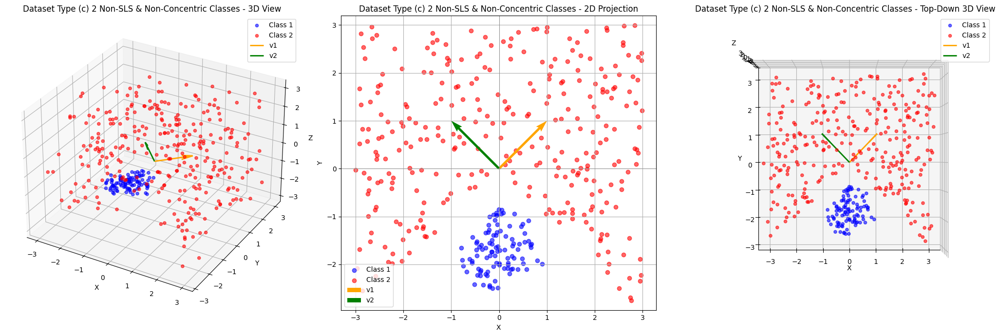


----------- STRICT SLS TEST RESULTS -----------

Class 0 Separation Error Rate: 21.25%

❌ Dataset is NOT SLS under strict conditions.

^ THIS DATASET IS NOT SLS, WHICH IS THE GOAL ✅
------------------------------------------------


In [ ]:
def generate_no_SLS_no_concentric_data():
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Select Classes and Setup
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    selected_digits = [0,1]
    Q = len(selected_digits)
    L = Q + 1

    print(f"DATA: Using synthetic classes: {selected_digits} | Q = {Q} | L = {L} \n")

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Create Synthetic Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    # Define the cone apex and two generating vectors
    p = np.array([0, 0, 0])
    v1 = np.array([1, 1, 0])
    v2 = np.array([-1, 1, 0])

    # Generating Class 1 points: inside the cone, with negative combinations of v1 and v2 + small noise
    def generate_class1(n=100):
        coeffs = -np.abs(np.random.rand(n, 2)) - 0.35 # Ensure negative direction
        return p + coeffs[:, 0][:, None]*v1 + coeffs[:, 1][:, None]*v2 + 0.1*np.random.randn(n, 3)

    # Generating Class 2 points: outside the cone by rejecting points with all-negative coefficients
    def generate_class2(n=100):
        pts = []
        while len(pts) < n:
            x = np.random.uniform(-3, 3, 3) # Sample randomly from a cube
            A = np.column_stack((v1, v2))
            coeffs = np.linalg.lstsq(A, x - p, rcond=None)[0] # Solve for cone coordinates
            if not np.all(coeffs <= 0): # Accept only points not inside the cone
                pts.append(x)
        return np.array(pts)

    X1 = generate_class1(100)
    X2 = generate_class2(300)

    y1 = np.zeros(X1.shape[0])
    y2 = np.ones(X2.shape[0])

    X = np.vstack([X1, X2])
    y = np.concatenate([y1, y2])

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Preprocess Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=42
    )

    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    X_test_tensor  = torch.tensor(X_test, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_test_tensor  = torch.tensor(y_test, dtype=torch.long)

    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    test_dataset  = TensorDataset(X_test_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

    x_train_flat = X_train.copy()
    y_train_subset = y_train.copy()

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Visualize Generated Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print('----------- VISUALIZING THE GENERATED SYNTHETIC DATA -----------\n')

    X1_2d = X1[:, :2]
    X2_2d = X2[:, :2]
    v1_2d = v1[:2]
    v2_2d = v2[:2]

    fig = plt.figure(figsize=(21, 7))

    ax1 = fig.add_subplot(1, 3, 1, projection='3d')
    ax1.scatter(X1[:, 0], X1[:, 1], X1[:, 2], color='blue', label='Class 1', alpha=0.6)
    ax1.scatter(X2[:, 0], X2[:, 1], X2[:, 2], color='red', label='Class 2', alpha=0.6)
    ax1.quiver(*p, *v1, color='orange', linewidth=2, label='v1')
    ax1.quiver(*p, *v2, color='green', linewidth=2, label='v2')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.set_title('Dataset Type (c) 2 Non-SLS & Non-Concentric Classes - 3D View')
    ax1.legend()

    ax2 = fig.add_subplot(1, 3, 2)
    ax2.scatter(X1_2d[:, 0], X1_2d[:, 1], color='blue', label='Class 1', alpha=0.6)
    ax2.scatter(X2_2d[:, 0], X2_2d[:, 1], color='red', label='Class 2', alpha=0.6)
    ax2.quiver(p[0], p[1], v1_2d[0], v1_2d[1], angles='xy', scale_units='xy', scale=1, color='orange', label='v1')
    ax2.quiver(p[0], p[1], v2_2d[0], v2_2d[1], angles='xy', scale_units='xy', scale=1, color='green', label='v2')
    ax2.axhline(0, color='gray', linewidth=0.5)
    ax2.axvline(0, color='gray', linewidth=0.5)
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('Dataset Type (c) 2 Non-SLS & Non-Concentric Classes - 2D Projection')
    ax2.legend()
    ax2.grid(True)
    ax2.axis('equal')

    ax3 = fig.add_subplot(1, 3, 3, projection='3d')
    ax3.scatter(X1[:, 0], X1[:, 1], X1[:, 2], color='blue', label='Class 1', alpha=0.6)
    ax3.scatter(X2[:, 0], X2[:, 1], X2[:, 2], color='red', label='Class 2', alpha=0.6)
    ax3.quiver(*p, *v1, color='orange', linewidth=2, label='v1')
    ax3.quiver(*p, *v2, color='green', linewidth=2, label='v2')
    ax3.view_init(elev=90, azim=-90)
    ax3.set_xlabel('X')
    ax3.set_ylabel('Y')
    ax3.set_zlabel('Z')
    ax3.set_title('Dataset Type (c) 2 Non-SLS & Non-Concentric Classes - Top-Down 3D View')
    ax3.legend()

    plt.tight_layout()
    plt.show()

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Check for SLS
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    run_sls_analysis(x_train_flat, y_train_subset, selected_digits, strict_threshold=0.04)
    print('\n^ THIS DATASET IS NOT SLS, WHICH IS THE GOAL ✅')

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print('------------------------------------------------')

    return {
        'Q': Q,
        'X': X, 'y': y,
        'X_train': X_train, 'y_train': y_train,
        'train_loader': train_loader,
        'test_loader': test_loader
    }

_ = generate_no_SLS_no_concentric_data()

> **Synthetic Dataset Type (d) - 2 Concentric Classes *(like Figure 1b in [Ewa25]).***
> * **Slide 19**

<img src="https://drive.google.com/uc?id=1Xru8EXduh0ozSnUitQdX6736Rp6e1jhL" width="300">

**The Following was my Logic for Generating the Data:**

- **Class 0 (Inner Class):** Uniformly sampled from a filled disk centered at the origin; generated using polar coordinates with radius uniformly sampled.

- **Class 1 (Outer Class):** Uniformly sampled from a surrounding ring (hollow disk), ensuring separation from Class 0 and forming a concentric class structure.

DATA: Using synthetic concentric classes: [0, 1] | Q = 2 | L = 3 

----------- VISUALIZING CONCENTRIC DATA (FILLED) -----------



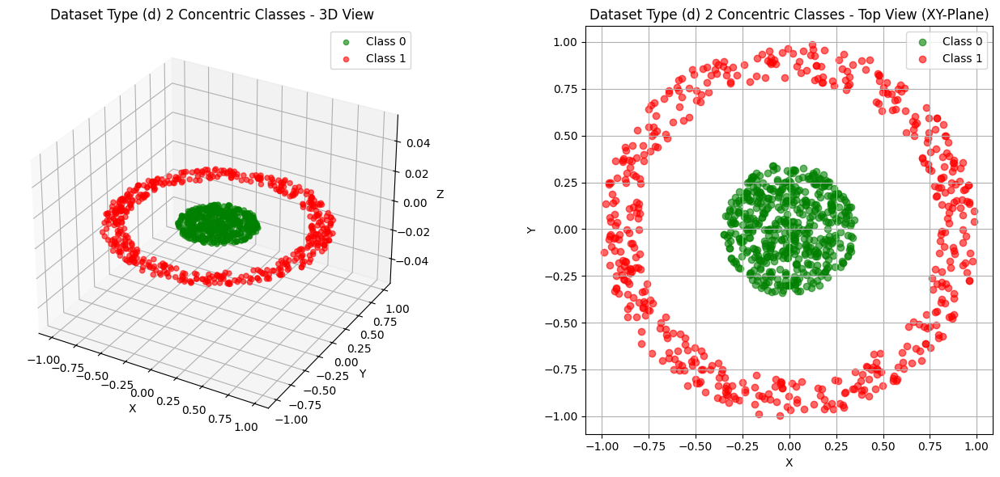

In [ ]:
def generate_concentric_data():
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Select Classes and Setup
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    selected_digits = [0, 1]
    Q = len(selected_digits)
    L = Q + 1

    print(f"DATA: Using synthetic concentric classes: {selected_digits} | Q = {Q} | L = {L} \n")

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Create Synthetic Data (Filled Disk + Ring)
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    # Generates points evenly inside a filled disk
    def generate_filled_disk(radius=0.35, n_samples=500):
        r = np.sqrt(np.random.uniform(0, radius**2, n_samples)) # Random radius (more points near center)
        theta = np.random.uniform(0, 2 * np.pi, n_samples) # Random angle from 0 to 2π
        x = r * np.cos(theta)
        y = r * np.sin(theta)
        return np.column_stack([x, y]) # Shape: (n_samples, 2)

    # Generates points evenly in a ring (hollow disk)
    def generate_ring(inner=0.8, outer=1.0, n_samples=500):
        r = np.sqrt(np.random.uniform(inner**2, outer**2, n_samples)) # Random radius between inner and outer
        theta = np.random.uniform(0, 2 * np.pi, n_samples) # Random angle from 0 to 2π
        x = r * np.cos(theta)
        y = r * np.sin(theta)
        return np.column_stack([x, y]) # Shape: (n_samples, 2)


    X0 = generate_filled_disk()
    X1 = generate_ring()

    y0 = np.zeros(X0.shape[0])
    y1 = np.ones(X1.shape[0])

    X = np.vstack([X0, X1]) # Shape: (1000, 2)
    y = np.concatenate([y0, y1]) # Shape: (1000,)
    X = np.hstack([X, np.zeros((X.shape[0], 1))]) # Lift to ℝ³: z = 0 → Shape: (1000, 3)

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Preprocess Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=42
    )

    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    X_test_tensor  = torch.tensor(X_test, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_test_tensor  = torch.tensor(y_test, dtype=torch.long)

    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    test_dataset  = TensorDataset(X_test_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Visualize Generated Data
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print("----------- VISUALIZING CONCENTRIC DATA (FILLED) -----------\n")

    fig = plt.figure(figsize=(14, 6))

    # 3D View
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    colors = ['green', 'red']
    for label in np.unique(y):
        ax1.scatter(X[y == label, 0], X[y == label, 1], X[y == label, 2],
                    color=colors[int(label)], label=f'Class {int(label)}', alpha=0.6)
    ax1.set_title("Dataset Type (d) 2 Concentric Classes - 3D View")
    ax1.set_xlabel("X")
    ax1.set_ylabel("Y")
    ax1.set_zlabel("Z")
    ax1.legend()

    # Top-down 2D View
    ax2 = fig.add_subplot(1, 2, 2)
    for label in np.unique(y):
        ax2.scatter(X[y == label, 0], X[y == label, 1],
                    color=colors[int(label)], label=f'Class {int(label)}', alpha=0.6)
    ax2.set_title("Dataset Type (d) 2 Concentric Classes - Top View (XY-Plane)")
    ax2.set_xlabel("X")
    ax2.set_ylabel("Y")
    ax2.legend()
    ax2.set_aspect('equal')
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    return {
        'Q': Q,
        'X': X, 'y': y,
        'X_train': X_train, 'y_train': y_train,
        'train_loader': train_loader,
        'test_loader': test_loader
    }

_ = generate_concentric_data()

------
<br>

**Step No. 2 - Train, Extract Cumulative Parameters, Plot Cones & Truncation Maps**

> **(2.1) Designing a Pipeline**
> * **Slide 20 - Slide 22**

The goal of this code is to provide a unified method that dynamically trains the model, computes cumulative parameters, and visualizes the truncation maps and cones, adapting automatically based on **the number of classes in the input dataset (e.g., 2 or 3 classes).**

In [ ]:
def run_main_pipeline(dataset_type):
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Configure Based On Which Dataset Was Chosen
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    if dataset_type == 'a':
        print('You have chosen: (a) Gaussian Mixture - Synthetic Data in ℝ³')
        data = generate_gaussian_mixture_data()
        Q = data['Q']
        X = data['X']
        y = data['y']
        X_train = data['X_train']
        y_train = data['y_train']
        train_loader = data['train_loader']
        test_loader = data['test_loader']
    elif dataset_type == 'b':
        print('You have chosen: (b) Non-Clustered Data (SLS)')
        data = generate_non_clustered_sls_data()
        Q = data['Q']
        X = data['X']
        y = data['y']
        X_train = data['X_train']
        y_train = data['y_train']
        train_loader = data['train_loader']
        test_loader = data['test_loader']
    elif dataset_type == 'c':
        print('You have chosen: (c) 2 Non-SLS & Non-Concentric Classes')
        data = generate_no_SLS_no_concentric_data()
        Q = data['Q']
        X = data['X']
        y = data['y']
        X_train = data['X_train']
        y_train = data['y_train']
        train_loader = data['train_loader']
        test_loader = data['test_loader']
    elif dataset_type == 'd':
        print('You have chosen: (d) 2 Concentric Classes')
        data = generate_concentric_data()
        Q = data['Q']
        X = data['X']
        y = data['y']
        X_train = data['X_train']
        y_train = data['y_train']
        train_loader = data['train_loader']
        test_loader = data['test_loader']
    else:
        raise ValueError("Invalid dataset_type. Choose from {'a', 'b', 'c', 'd'}")

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Train a Neural Network [based on CE24]
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    input_dim = 3  # Always 3
    hidden_dims = [10] * Q  # Q hidden layers
    output_dim = Q  # Either 2 or 3 depending on dataset

    # ReLU Feedforward Network
    class TruncationNet(nn.Module):
        def __init__(self, input_dim=input_dim, hidden_dims=hidden_dims, output_dim=output_dim):  # input_dim = 3 for ℝ³
            super().__init__()
            dims = [input_dim] + hidden_dims + [output_dim]
            self.layers = nn.ModuleList([
                nn.Linear(dims[i], dims[i+1]) for i in range(len(dims)-1)
            ])

        def forward(self, x):
            for layer in self.layers[:-1]:
                x = F.relu(layer(x))
            return self.layers[-1](x)

    model = TruncationNet()
    #print(model)

    # --- Training Section ---

    print('\n----------- BEGIN TRAINING MODEL -----------\n')

    def one_hot(labels, num_classes):
        return torch.nn.functional.one_hot(labels, num_classes=num_classes).float()

    criterion = nn.MSELoss()  # squared L2 loss, matches the paper
    optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)  # slightly larger lr is fine for synthetic data

    epochs = 200
    for epoch in range(epochs):
        model.train()
        for data, target in train_loader:
            optimizer.zero_grad()

            # One-hot encode the labels
            target_onehot = one_hot(target, num_classes=Q)

            output = model(data)
            loss = criterion(output, target_onehot)

            loss.backward()
            optimizer.step()

        if (epoch+1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}, MSE Loss: {loss.item():.4f}')

    #print("Training done with MSELoss!")
    print(f"Final MSE Loss: {loss.item():.6f}")
    print('\n----------- END TRAINING MODEL -----------')

    # --- Testing Section ---

    print('----------- BEGIN TESTING MODEL -----------\n')
    model.eval()

    correct = 0
    total = 0

    with torch.no_grad():
        for data, target in test_loader:
            output = model(data)
            pred = output.argmax(dim=1)
            correct += (pred == target).sum().item()
            total += target.size(0)

    test_acc = correct / total
    print(f"Test Accuracy: {test_acc * 100:.2f}%")
    print('\n----------- END TESTING MODEL -----------\n')

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Determine cumulative parameters  𝑊(ℓ),𝑏(ℓ)
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    # extracting weights and biases
    Ws = []
    bs = []
    for layer in model.layers:
        Ws.append(layer.weight.detach().clone())
        bs.append(layer.bias.detach().clone())

    L = len(Ws)  # should equal Q+1
    L1 = len(bs) # should equal Q+1

    #print("Weights Length: ", L)
    #print("Biases Length: ", L1)

    W_cum_chain = []
    b_cum_chain = []

    for ell in range(L):  # loop through each layer
        if ell == 0:
            # for the first layer, cumulative weight and bias are just themselves
            Wcum = Ws[0]
            bcum = bs[0]
        else:
            # multiply the current layer's weight by the total weight so far
            Wcum = Ws[ell] @ W_cum_chain[-1]

            # for the bias:
            # start at zero, and for each previous bias, multiply it by all the weights that come after it (so they affect how the bias carries forward)
            btemp = 0
            for k in range(ell):
                chain = Ws[ell]
                for j in range(ell-1, k, -1):
                    chain = chain @ Ws[j]
                btemp += chain @ bs[k]

            # finally add the current layer's bias
            bcum = btemp + bs[ell]

        #print(f"Layer {ell+1}: W_cum shape = {Wcum.shape}, b_cum shape = {bcum.shape}")
        W_cum_chain.append(Wcum) # adds the current layer's cumulative weight to the final array
        b_cum_chain.append(bcum) # adds the current layer's cumulative bias to the final array
    print('- NOTE: FINISHED WITH CALCULATING CUMULATIVE PARAMETERS \n')

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Determine cones
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print('----------- BEGIN COMPUTING CONES -----------')

    def compute_cones(W_cum, b_cum, residual_tol=1e-4):
        cones = []
        for ell, (W, b) in enumerate(zip(W_cum, b_cum)):

            # making sure everything is pure NumPy (got warning before)
            if hasattr(W, 'detach'): W = W.detach().cpu().numpy()
            if hasattr(b, 'detach'): b = b.detach().cpu().numpy()

            # compute the pseudoinverse of W
            W_pinv = np.linalg.pinv(W)

            # compute base point: p = - W^+ b [Ewa25]
            p = -W_pinv @ b

            # compute edges: v_i = W^+ e_i for standard basis vectors e_i [Ewa25]
            m = W.shape[0]
            edges = []
            edge_residuals = []

            for i in range(m):
                ei = np.zeros(m)
                ei[i] = 1
                vi = W_pinv @ ei
                edges.append(vi)

                residual = np.linalg.norm(W @ vi - ei)
                edge_residuals.append(residual)

            cones.append({'base': p, 'edges': edges})

            print(f"\n=== Layer {ell+1} Cone Checks ===")

            # Surjectivity check (Lemma 2.1)
            rank = np.linalg.matrix_rank(W)
            rows, cols = W.shape
            print(f"Rank(W) = {rank} | Should be full row rank = {rows}")
            if rank == rows:
                print("✅ Surjective check passed, it is full row rank")
            else:
                print("⚠️ Not surjective")

            # Base point residual check
            base_residual = np.linalg.norm(W @ p + b)
            if base_residual <= residual_tol:
                print(f"✅ Base point residual ||Wp + b|| = {base_residual:.2e} (OK)")
            else:
                print(f"⚠️ Base point residual ||Wp + b|| = {base_residual:.2e} exceeds tolerance")

            # Edge residuals check
            edge_residuals = np.array(edge_residuals)
            num_failed_edges = np.sum(edge_residuals > residual_tol)
            mean_edge_residual = np.mean(edge_residuals)

            if num_failed_edges == 0:
              print(f"✅ All edge checks passed | Failing: {num_failed_edges}/{m} | Mean residual: {mean_edge_residual:.2e}")
            else:
              print(f"⚠️ Some edge residuals exceed tolerance | Failing: {num_failed_edges}/{m} | Mean residual: {mean_edge_residual:.2e}")

            print(f"------------------")

            # Overall pass/fail summary
            if rank == rows and base_residual <= residual_tol and num_failed_edges == 0:
                print("✅ Lemma 2.1 conditions are met")
            else:
                print("⚠️ Lemma 2.1 conditions are not met")

        print('\n----------- FINISHED COMPUTING CONES -----------\n')
        return cones

    cones = compute_cones(W_cum_chain, b_cum_chain)


    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Compute Truncated Data Using Truncation Map Definition
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    X_trunc_chain = []  # List to store truncated data for each layer

    for ell in range(Q):
        # Get cumulative parameters for layer ell: W^(ell) and b^(ell)
        Wcum = W_cum_chain[ell].detach().cpu().numpy()
        bcum = b_cum_chain[ell].detach().cpu().numpy()

        # Compute pseudoinverse of W^(ell)
        W_pinv = np.linalg.pinv(Wcum)

        # Compute pre-activation: Z = X * W^T + b
        Z = X_train @ Wcum.T + bcum

        # Apply ReLU nonlinearity: max(0, Z)
        Z_relu = np.maximum(Z, 0)

        # Apply truncation map definition:
        # τ_{W,b}(x) = W^(-1) (ReLU(Wx + b) - b)
        X_trunc = (W_pinv @ (Z_relu.T - bcum[:, np.newaxis])).T

        # Store truncated data for this layer
        X_trunc_chain.append(X_trunc)

        # Print shape for confirmation
        #print(f"Truncated data for layer {ell+1}: {X_trunc.shape}")

    print('- NOTE: FINISHED COMPUTING TRUNCATED DATA FOR EACH LAYER \n')

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------
    # Visualize Original, Truncated Layers, and Final Output Side by Side
    #-------------------------------------------------------------------------------------------------------------------------------------------------------------

    print('----------- VISUALIZING ALL TRANSFORMATIONS SIDE BY SIDE -----------\n')

    # Titles for each subplot: Original + Truncated Layers + Final Output
    titles = ["Original Data"] + [f"Truncated Layer {i+1}" for i in range(Q)] + ["Final Output"]

    # Data list for plotting: Original X + Truncated Xs + Final Output
    data_list = [X_train] + X_trunc_chain

    # Get model output for final layer
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    model.eval()
    with torch.no_grad():
        X_out = model(X_train_tensor).numpy()
    data_list.append(X_out)

    # Total number of subplots
    num_subplots = Q + 2  # Original + Q truncated layers + Final output

    # Create figure with dynamic width based on number of subplots
    fig = plt.figure(figsize=(5 * num_subplots, 5))

    # Create subplots
    for i in range(num_subplots):
        dim = data_list[i].shape[1]
        if dim == 3:
            ax = fig.add_subplot(1, num_subplots, i + 1, projection='3d')
        else:
            ax = fig.add_subplot(1, num_subplots, i + 1)

        for c in np.unique(y_train):
            idx = y_train == c
            if dim == 3:
                ax.scatter(
                    data_list[i][idx, 0],
                    data_list[i][idx, 1],
                    data_list[i][idx, 2],
                    s=10,
                    label=f"Class {c}"
                )
                ax.set_zlabel("X3")
                ax.view_init(elev=20, azim=30)
            else:
                ax.scatter(
                    data_list[i][idx, 0],
                    data_list[i][idx, 1],
                    s=10,
                    label=f"Class {c}"
                )

        ax.set_title(titles[i])
        ax.set_xlabel("X1")
        ax.set_ylabel("X2")
        if i == 0:
            ax.legend(loc='upper left', fontsize=8)

    plt.tight_layout()
    plt.show()

> **(2.2) Running The Code - Dataset Type a**
> * **Slide 23**

In [ ]:
run_main_pipeline('a') #Gaussian Mixture Model

> **(2.2) Running The Code - Dataset Type b**
> * **Slide 24**

In [ ]:
run_main_pipeline('b') #Non-Clustered Data (SLS)

> **(2.2) Running The Code - Dataset Type c**
> * **Slide 25**

In [ ]:
run_main_pipeline('c') #2 Non-SLS & Non-Concentric Classes

> **(2.2) Running The Code - Dataset Type d**
> * **Slide 26**

You have chosen: (d) 2 Concentric Classes
DATA: Using synthetic concentric classes: [0, 1] | Q = 2 | L = 3 

----------- VISUALIZING CONCENTRIC DATA (FILLED) -----------



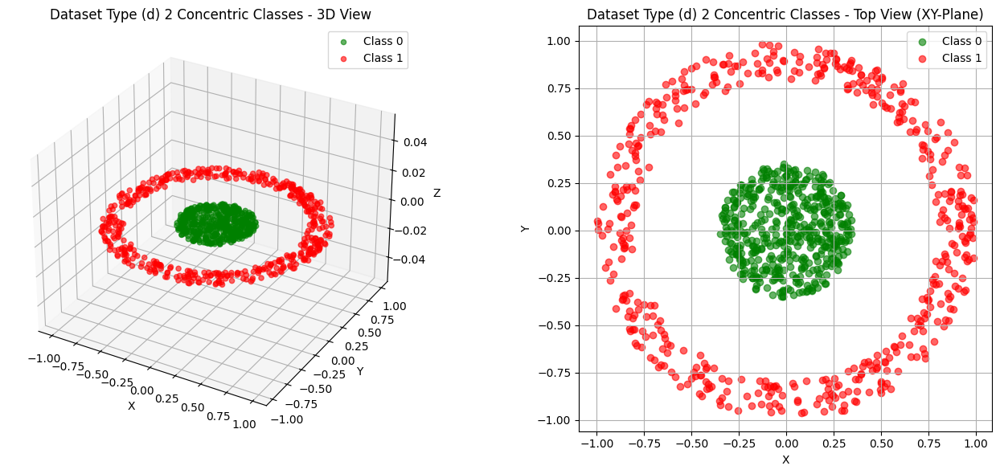


----------- BEGIN TRAINING MODEL -----------

Epoch 1, MSE Loss: 0.5202
Epoch 10, MSE Loss: 0.2537
Epoch 20, MSE Loss: 0.2504
Epoch 30, MSE Loss: 0.2527
Epoch 40, MSE Loss: 0.2493
Epoch 50, MSE Loss: 0.2440
Epoch 60, MSE Loss: 0.2431
Epoch 70, MSE Loss: 0.2417
Epoch 80, MSE Loss: 0.2292
Epoch 90, MSE Loss: 0.2321
Epoch 100, MSE Loss: 0.2204
Epoch 110, MSE Loss: 0.2319
Epoch 120, MSE Loss: 0.2244
Epoch 130, MSE Loss: 0.2075
Epoch 140, MSE Loss: 0.2208
Epoch 150, MSE Loss: 0.2023
Epoch 160, MSE Loss: 0.1874
Epoch 170, MSE Loss: 0.1842
Epoch 180, MSE Loss: 0.1572
Epoch 190, MSE Loss: 0.1464
Epoch 200, MSE Loss: 0.1375
Final MSE Loss: 0.137466

----------- END TRAINING MODEL -----------
----------- BEGIN TESTING MODEL -----------

Test Accuracy: 89.50%

----------- END TESTING MODEL -----------

- NOTE: FINISHED WITH CALCULATING CUMULATIVE PARAMETERS 

----------- BEGIN COMPUTING CONES -----------

=== Layer 1 Cone Checks ===
Rank(W) = 3 | Should be full row rank = 10
⚠️ Not surjective
⚠️

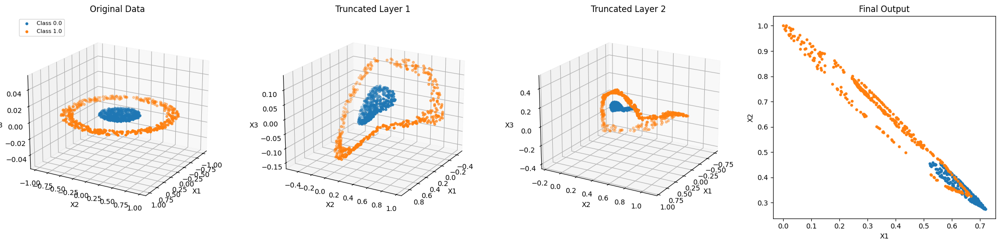

In [ ]:
run_main_pipeline('d') #2 Concentric Classes

## **Experiment No.2 - Hyperplane Separation**
## **(New Code Continued: Slide 28 - Slide 38)**

***(So.... What's the Point?) - Slide 28***

**Training networks has too little intuition**
* Normally, we train a neural net and it spits out a result.
* But why it works and what it’s learning is unclear.

**Goal:**
To intuitively understand how a neural network separates digits by using simple geometric shapes (hyperplanes) in a high-dimensional space. This helps us "see" how digits like 0, 1, and 2 might be distinguishable just based on which parts of an image are black or white.

* Instead of using cones, use specific pixels to guess separating hyperplanes.
* Try constructing hyperplanes from filled pixels unique to one digit.
* Can be more intuitive and less restrictive than cones.

so… ***What are the hyperplanes doing inside the network? Can we see or guess them intuitively?***
<br>

----

> **(1) Toy 5x5 Model *(basic version as described by Professor Chen)***
> * **Slide 29  - Slide 31**


 ---------------------------------- STEP 1 ----------------------------------



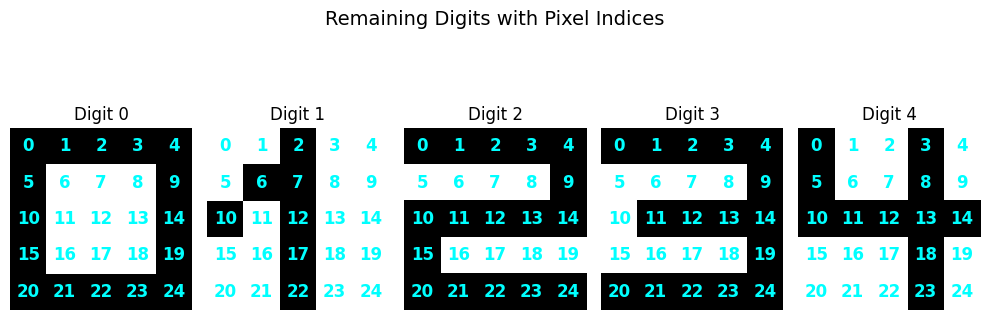


Hyperplanes (xᵒ = 0.5) that can uniquely separate each digit:
Digit 1 (vs digits 0, 2, 3, 4): Hyperplane x6 = 0.5, Hyperplane x7 = 0.5, Hyperplane x17 = 0.5
Digit 4 (vs digits 0, 1, 2, 3): Hyperplane x8 = 0.5, Hyperplane x18 = 0.5

------
Classification Accuracy Using Pixel x6 for Digit 1: 1.00

y:        [0 1 2 3 4]
y_binary: [0 1 0 0 0]
y_pred:   [0 1 0 0 0]
------



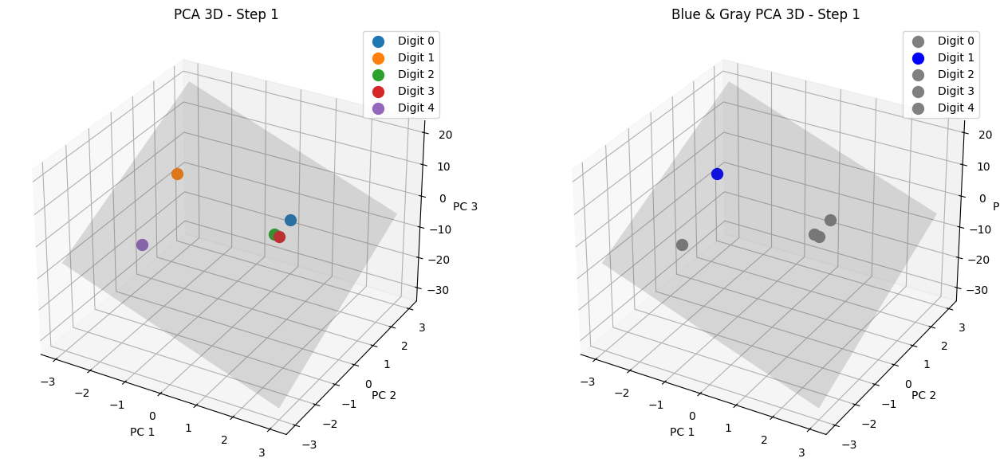


 ---------------------------------- STEP 2 ----------------------------------



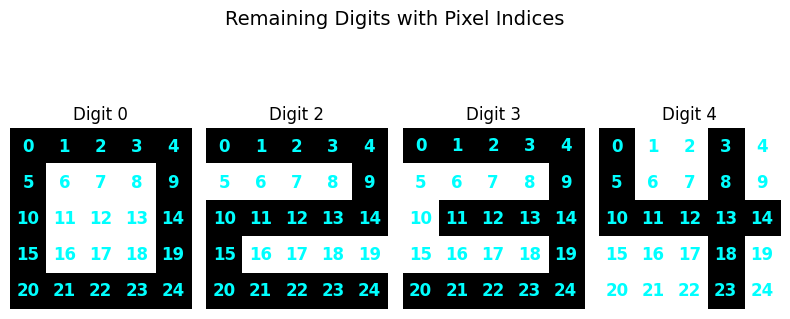


Hyperplanes (xᵒ = 0.5) that can uniquely separate each digit:
Digit 4 (vs digits 0, 2, 3): Hyperplane x8 = 0.5, Hyperplane x18 = 0.5

------
Classification Accuracy Using Pixel x8 for Digit 4: 1.00

y:        [0 2 3 4]
y_binary: [0 0 0 1]
y_pred:   [0 0 0 1]
------



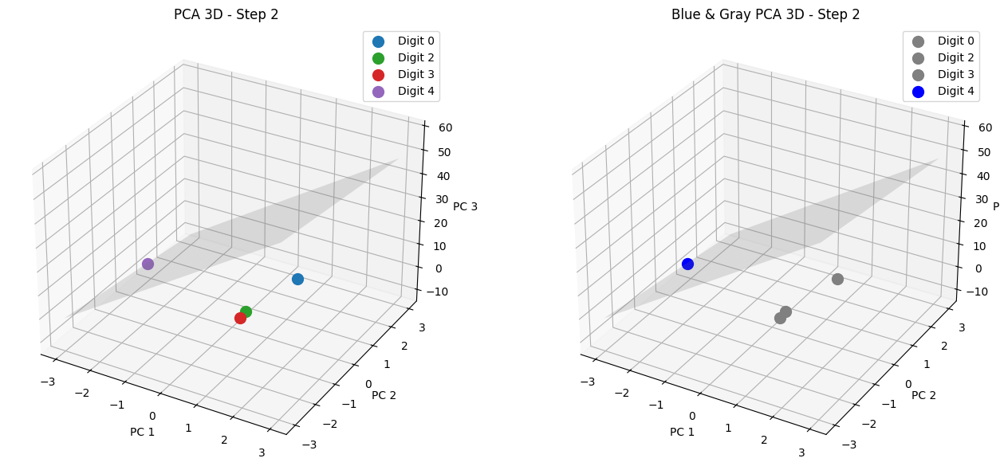


 ---------------------------------- STEP 3 ----------------------------------



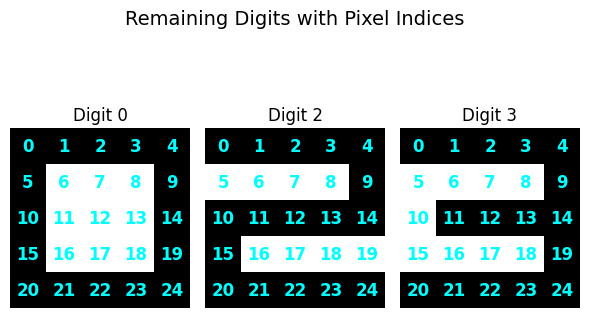


Hyperplanes (xᵒ = 0.5) that can uniquely separate each digit:
Digit 0 (vs digits 2, 3): Hyperplane x5 = 0.5

------
Classification Accuracy Using Pixel x5 for Digit 0: 1.00

y:        [0 2 3]
y_binary: [1 0 0]
y_pred:   [1 0 0]
------



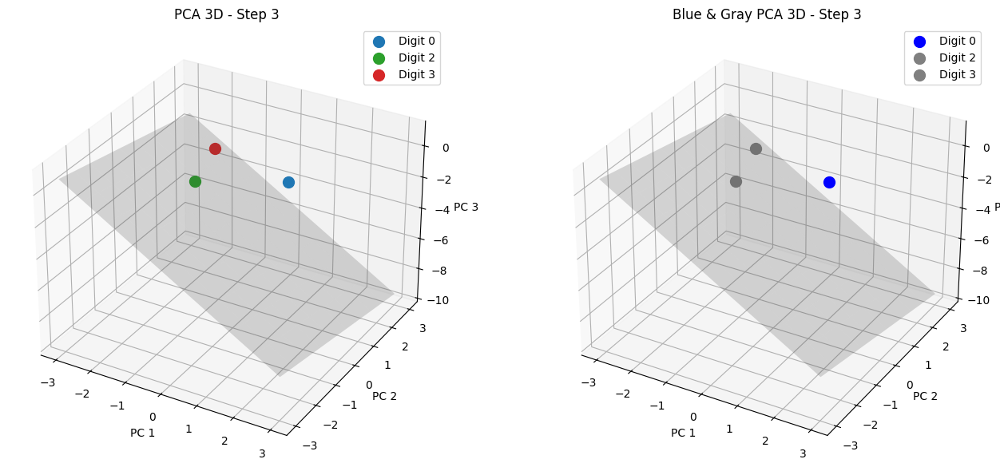


 ---------------------------------- STEP 4 ----------------------------------



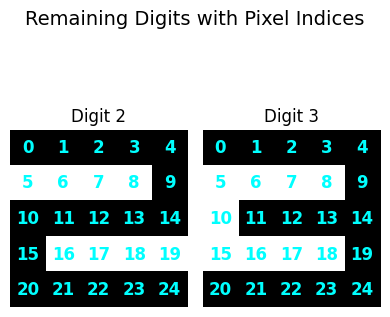


Hyperplanes (xᵒ = 0.5) that can uniquely separate each digit:
Digit 2 (vs digits 3): Hyperplane x10 = 0.5, Hyperplane x15 = 0.5
Digit 3 (vs digits 2): Hyperplane x19 = 0.5

------
Classification Accuracy Using Pixel x10 for Digit 2: 1.00

y:        [2 3]
y_binary: [1 0]
y_pred:   [1 0]
------



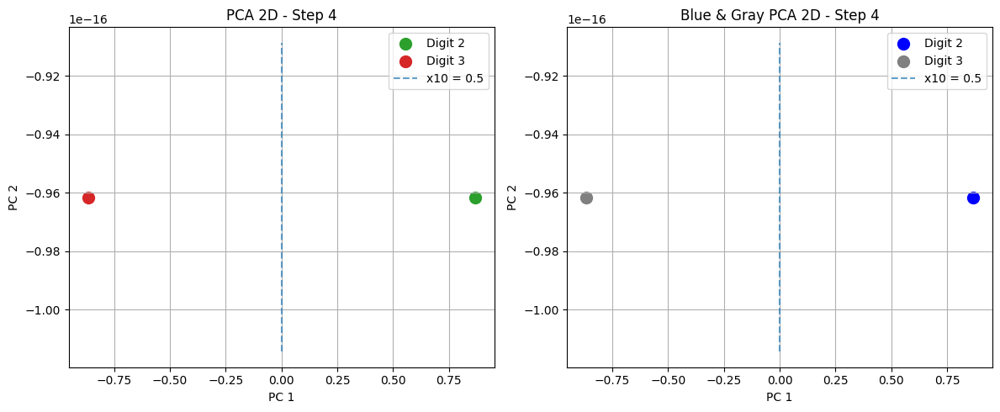


--------------------------------------------------------------------

Final Separation Steps:
Step 1: Separate Digit 1 with pixel x6 = 0.5
Step 2: Separate Digit 4 with pixel x8 = 0.5
Step 3: Separate Digit 0 with pixel x5 = 0.5
Step 4: Separate Digit 2 with pixel x10 = 0.5


In [ ]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step #1 - Define Toy Digits
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from matplotlib import colormaps

# Define toy digits (0-4)
digit_0 = np.array([
    [1, 1, 1, 1, 1],
    [1, 0, 0, 0, 1],
    [1, 0, 0, 0, 1],
    [1, 0, 0, 0, 1],
    [1, 1, 1, 1, 1]
])

digit_1 = np.array([
    [0, 0, 1, 0, 0],
    [0, 1, 1, 0, 0],
    [1, 0, 1, 0, 0],
    [0, 0, 1, 0, 0],
    [0, 0, 1, 0, 0]
])

digit_2 = np.array([
    [1, 1, 1, 1, 1],
    [0, 0, 0, 0, 1],
    [1, 1, 1, 1, 1],
    [1, 0, 0, 0, 0],
    [1, 1, 1, 1, 1]
])

digit_3 = np.array([
    [1, 1, 1, 1, 1],
    [0, 0, 0, 0, 1],
    [0, 1, 1, 1, 1],
    [0, 0, 0, 0, 1],
    [1, 1, 1, 1, 1]
])

digit_4 = np.array([
    [1, 0, 0, 1, 0],
    [1, 0, 0, 1, 0],
    [1, 1, 1, 1, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 0, 1, 0]
])

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step #2 - Flatten Digits and Start Separation
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
H, W = digit_0.shape
D = H * W
all_digits = [digit_0, digit_1, digit_2, digit_3, digit_4]
all_labels = np.array([0, 1, 2, 3, 4])
separation_steps = []

cmap = colormaps['tab10']
label_to_color = {label: cmap(label) for label in all_labels}
remaining_digits = list(all_digits)
remaining_labels = list(all_labels)
step = 1

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step #3 - Loop Until One Digit Left
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
while len(remaining_digits) > 1:
    print(f'\n ---------------------------------- STEP {step} ----------------------------------\n')
    X = np.array([d.flatten() for d in remaining_digits])
    y = np.array(remaining_labels)

    # Unique pixel detection
    unique_pixels = {}
    for i in range(D):
        values = X[:, i]
        if list(values).count(1) == 1:
            digit = np.argmax(values)
            if digit not in unique_pixels:
                unique_pixels[digit] = []
            unique_pixels[digit].append(i)

    if not unique_pixels:
        break

    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Step #4 - Visualize Remaining Digits and Pixel Indices
    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    fig, axes = plt.subplots(1, len(remaining_digits), figsize=(2 * len(remaining_digits), 4))
    titles = [f"Digit {label}" for label in remaining_labels]
    for idx, ax in enumerate(axes):
        img = remaining_digits[idx]
        ax.imshow(1 - img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(titles[idx])
        for i in range(H):
            for j in range(W):
                pixel_idx = i * W + j
                ax.text(j, i, str(pixel_idx), ha='center', va='center', color='cyan', fontsize=12, fontweight='bold')
        ax.axis('off')
    plt.suptitle("Remaining Digits with Pixel Indices", fontsize=14)
    plt.tight_layout()
    plt.show()

    # Print discovered hyperplanes
    print("\nHyperplanes (xᵒ = 0.5) that can uniquely separate each digit:")
    for digit, indices in unique_pixels.items():
        digit_label = y[digit]
        rest_digits = [str(lbl) for lbl in y if lbl != digit_label]
        rest_str = f" (vs digits {', '.join(rest_digits)})" if rest_digits else ""
        hyperplanes = ", ".join(f"Hyperplane x{idx} = 0.5" for idx in indices)
        print(f"Digit {digit_label}{rest_str}: {hyperplanes}")

    # Pick first digit and pixel
    chosen_digit_idx = list(unique_pixels.keys())[0]
    chosen_digit_label = y[chosen_digit_idx]
    chosen_pixel = unique_pixels[chosen_digit_idx][0]

    def hyperplane_classifier(X, pixel_idx):
        return (X[:, pixel_idx] > 0.5).astype(int)

    y_binary = (y == chosen_digit_label).astype(int)
    y_pred = hyperplane_classifier(X, chosen_pixel)
    acc = accuracy_score(y_binary, y_pred)

    print('\n------')
    print(f"Classification Accuracy Using Pixel x{chosen_pixel} for Digit {chosen_digit_label}: {acc:.2f}\n")
    print("y:       ", y)
    print("y_binary:", y_binary)
    print("y_pred:  ", y_pred)
    print('------\n')

    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Step #5 - PCA Visualization (Part A)
    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    if len(remaining_digits) >= 3:
        pca = PCA(n_components=3)
        X_pca = pca.fit_transform(X)

        fig = plt.figure(figsize=(14, 6))
        ax1 = fig.add_subplot(121, projection='3d')
        ax2 = fig.add_subplot(122, projection='3d')

        # Left: With colors for all digits
        for i in range(len(X)):
            digit_label = y[i]
            ax1.scatter(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], color=label_to_color[digit_label], label=f"Digit {digit_label}" if f"Digit {digit_label}" not in ax1.get_legend_handles_labels()[1] else "", s=100)

        # Right: With color for only target digits
        seen_labels = set()
        for i in range(len(X)):
            label = f"Digit {y[i]}"
            color = 'blue' if y_pred[i] == 1 else 'gray'
            ax2.scatter(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], color=color, label=label if label not in seen_labels else "", s=100)
            seen_labels.add(label)

        # Common hyperplane in PCA space
        normal = np.zeros(D)
        normal[chosen_pixel] = 1.0
        normal_pca = pca.components_ @ normal
        point = np.zeros(D)
        point[chosen_pixel] = 0.5
        point_pca = pca.transform(point.reshape(1, -1))[0]
        xx, yy = np.meshgrid(np.linspace(-3, 3, 10), np.linspace(-3, 3, 10))
        zz = (-normal_pca[0] * xx - normal_pca[1] * yy + point_pca[2]) / normal_pca[2]

        for ax in [ax1, ax2]:
            ax.plot_surface(xx, yy, zz, color='gray', alpha=0.2)
            ax.set_xlabel("PC 1")
            ax.set_ylabel("PC 2")
            ax.set_zlabel("PC 3")

        ax1.set_title(f"PCA 3D - Step {step}")
        ax2.set_title(f"Blue & Gray PCA 3D - Step {step}")
        ax1.legend()
        ax2.legend()
        plt.tight_layout()
        plt.show()

    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Step #5 - PCA Visualization (Part B)
    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    else:
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

        # Left: With colors for all digits
        for i in range(len(X)):
            digit_label = y[i]
            ax1.scatter(X_pca[i, 0], X_pca[i, 1], color=label_to_color[digit_label], label=f"Digit {digit_label}" if f"Digit {digit_label}" not in ax1.get_legend_handles_labels()[1] else "", s=100)

        # Right: With color for only target digits
        seen_labels = set()
        for i in range(len(X)):
            label = f"Digit {y[i]}"
            color = 'blue' if y_pred[i] == 1 else 'gray'
            ax2.scatter(X_pca[i, 0], X_pca[i, 1], color=color, label=label if label not in seen_labels else "", s=100)
            seen_labels.add(label)

        normal = np.zeros(D)
        normal[chosen_pixel] = 1.0
        normal_pca = pca.components_ @ normal
        point = np.zeros(D)
        point[chosen_pixel] = 0.5
        point_pca = pca.transform(point.reshape(1, -1))[0]

        if abs(normal_pca[1]) < 1e-6:
            x_vals = np.full(100, point_pca[0])
            y_vals = np.linspace(*ax1.get_ylim(), 100)
        else:
            slope = -normal_pca[0] / normal_pca[1]
            x_vals = np.linspace(*ax1.get_xlim(), 100)
            y_vals = slope * (x_vals - point_pca[0]) + point_pca[1]

        for ax in [ax1, ax2]:
            ax.plot(x_vals, y_vals, '--', alpha=0.7, label=f"x{chosen_pixel} = 0.5")
            ax.set_xlabel("PC 1")
            ax.set_ylabel("PC 2")
            ax.legend()
            ax.grid(True)

        ax1.set_title(f"PCA 2D - Step {step}")
        ax2.set_title(f"Blue & Gray PCA 2D - Step {step}")
        plt.tight_layout()
        plt.show()

    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Step #6 - Remove Separated Digit and Iterate
    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    separation_steps.append(f"Step {step}: Separate Digit {chosen_digit_label} with pixel x{chosen_pixel} = 0.5")
    keep_indices = [i for i in range(len(y)) if y[i] != chosen_digit_label]
    remaining_digits = [remaining_digits[i] for i in keep_indices]
    remaining_labels = [remaining_labels[i] for i in keep_indices]
    step += 1

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step #7 - Final Summary
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
print("\n--------------------------------------------------------------------")
print("\nFinal Separation Steps:")
for line in separation_steps:
    print(line)


> **(2) MNIST Data Model *(basic, an upgrade from the Toy Model)***
> * **Slide 32 - Slide 33**

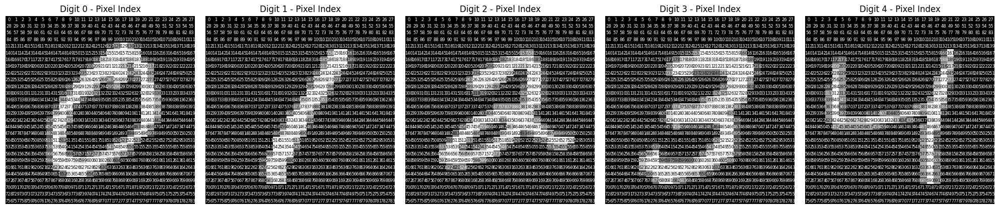

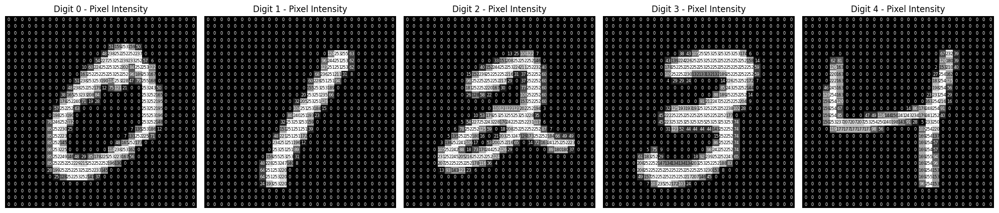

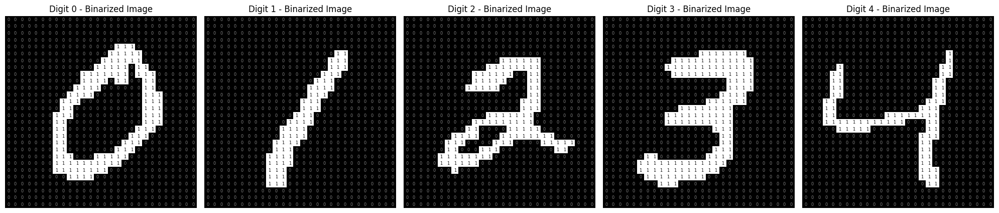


all_digits = [ digit_0, digit_1, digit_2, digit_3, digit_4 ]
all_labels = np.array( [0, 1, 2, 3, 4] )


In [ ]:
# PART 1: CODE FOR DATA GENERATION

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step I - Import Dependencies
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from matplotlib import colormaps
from torchvision import datasets

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step II - Select Digits
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
selected_digits = [0, 1, 2, 3, 4]
digit_images = {}

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step III - Load MNIST Dataset (No Transform)
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
raw_mnist = datasets.MNIST(root='./data', train=True, download=True, transform=None)

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step IV - Extract One Example per Digit
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
for img, label in raw_mnist:
    if label in selected_digits and label not in digit_images:
        digit_images[label] = np.array(img)  # convert PIL to NumPy array
    if len(digit_images) == len(selected_digits):
        break

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step V - Figure 1: Pixel Index Overlaid
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
fig1, axes1 = plt.subplots(1, len(selected_digits), figsize=(20, 6))
for i, digit in enumerate(selected_digits):
    img_array = digit_images[digit]
    axes1[i].imshow(img_array, cmap='gray', vmin=0, vmax=255)
    axes1[i].set_title(f"Digit {digit} - Pixel Index")
    axes1[i].axis("off")

    for y in range(28):
        for x in range(28):
            flat_index = y * 28 + x
            color = "white" if img_array[y, x] < 128 else "black"
            axes1[i].text(x, y, str(flat_index), ha='center', va='center', fontsize=6, color=color)

plt.tight_layout()
plt.show()

print('')
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step VI - Figure 2: Grayscale Intensities Only
#-------------------------------------------------------------------------------------------------------------------------------------------------------------

fig, axes = plt.subplots(1, len(selected_digits), figsize=(20, 6))
for i, digit in enumerate(selected_digits):
    img_array = np.array(digit_images[digit])
    axes[i].imshow(img_array, cmap='gray', vmin=0, vmax=255)
    axes[i].set_title(f"Digit {digit} - Pixel Intensity")
    axes[i].axis("off")

    # Write pixel values
    for y in range(img_array.shape[0]):
        for x in range(img_array.shape[1]):
            val = img_array[y, x]
            color = "white" if val < 128 else "black"  # adjust text color for visibility
            axes[i].text(x, y, str(val), ha='center', va='center', fontsize=6, color=color)

plt.tight_layout()
plt.show()

print('')
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step VII - Binarize Images (Threshold 128)
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
binarized_digits = {}
threshold = 128
for label in selected_digits:
    binarized_digits[label] = (digit_images[label] > threshold).astype(int)

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step VIII - Plot Binarized Images
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
fig2, axes2 = plt.subplots(1, len(selected_digits), figsize=(20, 8))
for i, digit in enumerate(selected_digits):
    bin_img = binarized_digits[digit]
    axes2[i].imshow(bin_img, cmap='gray', vmin=0, vmax=1)
    axes2[i].set_title(f"Digit {digit} - Binarized Image")
    axes2[i].axis("off")

    # Optionally write pixel values (0 or 1)
    for y in range(bin_img.shape[0]):
        for x in range(bin_img.shape[1]):
            val = bin_img[y, x]
            color = "black" if val == 1 else "gray"
            axes2[i].text(x, y, str(val), ha='center', va='center', fontsize=6, color=color)

plt.tight_layout()
plt.show()

print('')
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step IX - Format as Python Arrays
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Assign digit images to variables named digit_0, digit_1, digit_8, etc.
for label in selected_digits:
    globals()[f"digit_{label}"] = binarized_digits[label]


# Final containers like in your toy digits code
all_digits = [globals()[f"digit_{d}"] for d in selected_digits]
all_labels = np.array(selected_digits)

print("all_digits = [", ", ".join([f"digit_{d}" for d in selected_digits]), "]")
print("all_labels = np.array(", selected_digits, ")")


 ---------------------------------- STEP 1 ----------------------------------


Hyperplanes (xᵢ = 0.5) that can uniquely separate each digit:
Digit 0 (vs digits 1, 2, 3, 4): x128 = 0.5, x129 = 0.5, x130 = 0.5, x317 = 0.5, x318 = 0.5, and 28 more...
Digit 3 (vs digits 0, 1, 2, 4): x154 = 0.5, x178 = 0.5, x179 = 0.5, x180 = 0.5, x181 = 0.5, and 18 more...
Digit 4 (vs digits 0, 1, 2, 3): x161 = 0.5, x201 = 0.5, x228 = 0.5, x229 = 0.5, x256 = 0.5, and 28 more...
Digit 2 (vs digits 0, 1, 3, 4): x262 = 0.5, x289 = 0.5, x458 = 0.5, x463 = 0.5, x485 = 0.5, and 17 more...
Digit 1 (vs digits 0, 2, 3, 4): x295 = 0.5, x296 = 0.5, x297 = 0.5, x323 = 0.5, x324 = 0.5, and 13 more...

------
Classification Accuracy Using Pixel x128 for Digit 0: 1.00

y:        [0 1 2 3 4]
y_binary: [1 0 0 0 0]
y_pred:   [1 0 0 0 0]
------



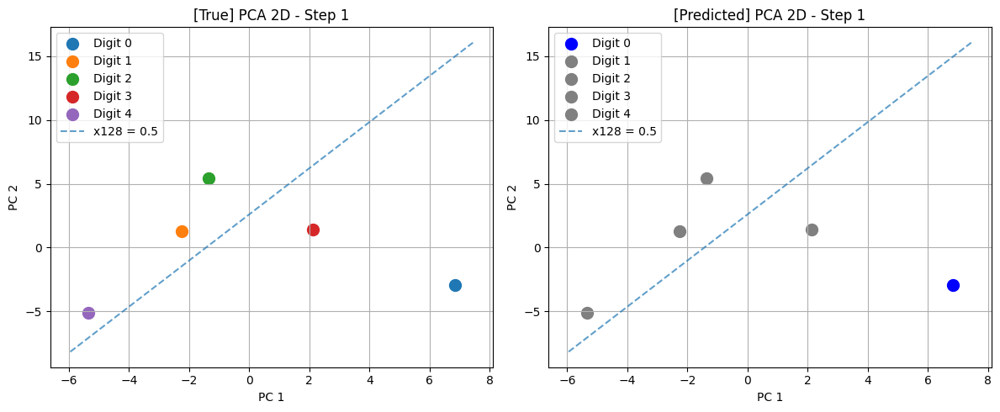


 ---------------------------------- STEP 2 ----------------------------------


Hyperplanes (xᵢ = 0.5) that can uniquely separate each digit:
Digit 3 (vs digits 1, 2, 4): x154 = 0.5, x155 = 0.5, x156 = 0.5, x157 = 0.5, x158 = 0.5, and 38 more...
Digit 4 (vs digits 1, 2, 3): x161 = 0.5, x201 = 0.5, x228 = 0.5, x229 = 0.5, x256 = 0.5, and 32 more...
Digit 2 (vs digits 1, 3, 4): x262 = 0.5, x263 = 0.5, x264 = 0.5, x265 = 0.5, x266 = 0.5, and 32 more...
Digit 1 (vs digits 2, 3, 4): x268 = 0.5, x269 = 0.5, x295 = 0.5, x296 = 0.5, x297 = 0.5, and 15 more...

------
Classification Accuracy Using Pixel x154 for Digit 3: 1.00

y:        [1 2 3 4]
y_binary: [0 0 1 0]
y_pred:   [0 0 1 0]
------



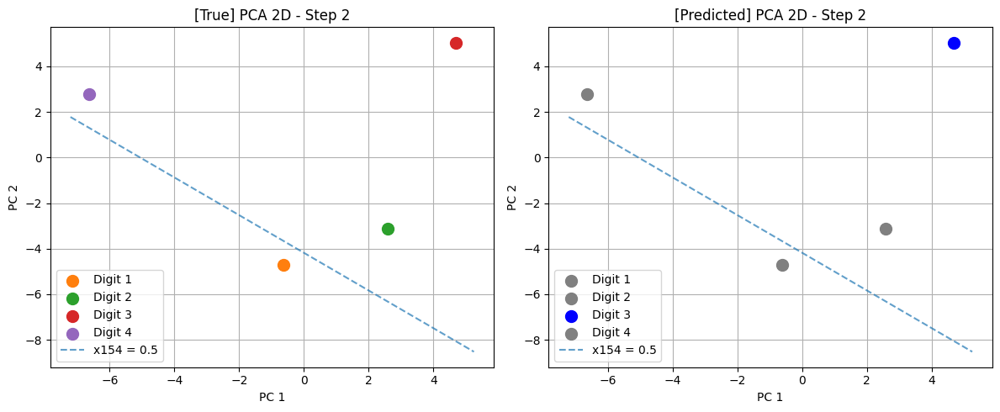


 ---------------------------------- STEP 3 ----------------------------------


Hyperplanes (xᵢ = 0.5) that can uniquely separate each digit:
Digit 1 (vs digits 2, 4): x159 = 0.5, x160 = 0.5, x188 = 0.5, x241 = 0.5, x268 = 0.5, and 35 more...
Digit 4 (vs digits 1, 2): x161 = 0.5, x189 = 0.5, x201 = 0.5, x217 = 0.5, x228 = 0.5, and 48 more...
Digit 2 (vs digits 1, 4): x182 = 0.5, x183 = 0.5, x184 = 0.5, x185 = 0.5, x208 = 0.5, and 61 more...

------
Classification Accuracy Using Pixel x159 for Digit 1: 1.00

y:        [1 2 4]
y_binary: [1 0 0]
y_pred:   [1 0 0]
------



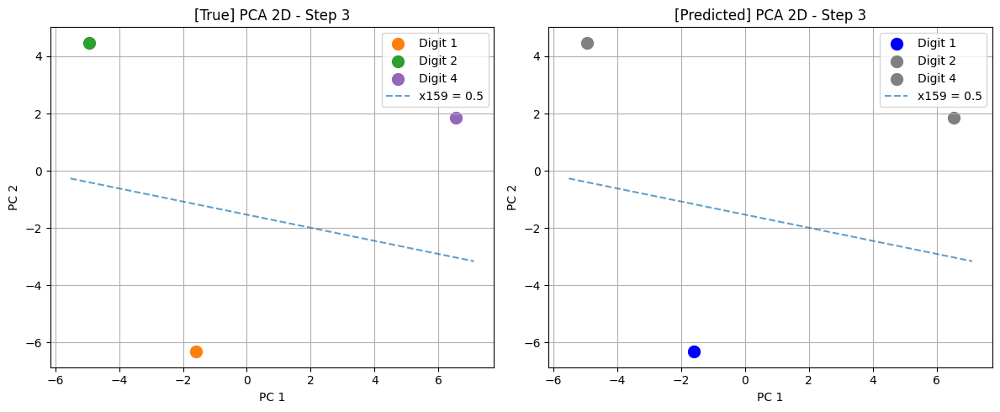


 ---------------------------------- STEP 4 ----------------------------------


Hyperplanes (xᵢ = 0.5) that can uniquely separate each digit:
Digit 4 (vs digits 2): x161 = 0.5, x189 = 0.5, x201 = 0.5, x216 = 0.5, x217 = 0.5, and 49 more...
Digit 2 (vs digits 4): x182 = 0.5, x183 = 0.5, x184 = 0.5, x185 = 0.5, x186 = 0.5, and 80 more...

------
Classification Accuracy Using Pixel x161 for Digit 4: 1.00

y:        [2 4]
y_binary: [0 1]
y_pred:   [0 1]
------



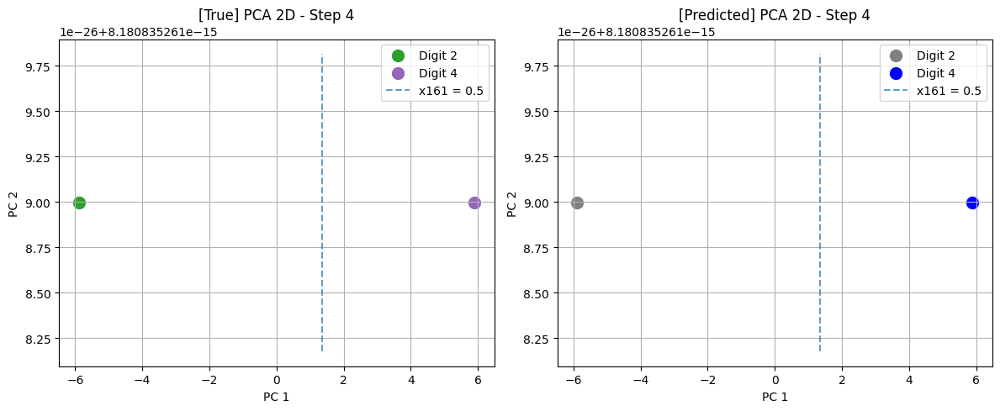


--------------------------------------------------------------------

Final Separation Steps:
Step 1: Separate Digit 0 with pixel x128 = 0.5
Step 2: Separate Digit 3 with pixel x154 = 0.5
Step 3: Separate Digit 1 with pixel x159 = 0.5
Step 4: Separate Digit 4 with pixel x161 = 0.5


In [ ]:
# PART 2: CODE FOR HYPERPLANE ANALYSIS

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step #1 - Setup Parameters and Initialization
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Flatten digits into vectors, set up color mapping, and prepare loop for iterative separation using unique pixel-based hyperplanes.
H, W = digit_0.shape
D = H * W
separation_steps = []
cmap = colormaps['tab10']
label_to_color = {label: cmap(label) for label in all_labels}
remaining_digits = list(all_digits)
remaining_labels = list(all_labels)
step = 1

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step #2 - Loop: Identify and Apply Separating Hyperplanes
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Iteratively find pixels that uniquely identify a digit, classify with those pixels, and remove the identified digit.
while len(remaining_digits) > 1:
    print(f'\n ---------------------------------- STEP {step} ----------------------------------\n')
    X = np.array([d.flatten() for d in remaining_digits])
    y = np.array(remaining_labels)

    # Find pixels active in only one digit (unique pixel hyperplanes)
    unique_pixels = {}
    for i in range(D):
        values = X[:, i]
        if list(values).count(1) == 1:
            digit = np.argmax(values)
            if digit not in unique_pixels:
                unique_pixels[digit] = []
            unique_pixels[digit].append(i)

    if not unique_pixels:
        break

    # Display discovered separating pixels (hyperplanes)
    print("\nHyperplanes (xᵢ = 0.5) that can uniquely separate each digit:")
    for digit, indices in unique_pixels.items():
        digit_label = y[digit]
        rest_digits = [str(lbl) for lbl in y if lbl != digit_label]
        rest_str = f" (vs digits {', '.join(rest_digits)})" if rest_digits else ""
        shown = indices[:5]
        extra = len(indices) - len(shown)
        hyperplanes = ", ".join(f"x{idx} = 0.5" for idx in shown)
        suffix = f", and {extra} more..." if extra > 0 else ""
        print(f"Digit {digit_label}{rest_str}: {hyperplanes}{suffix}")


    # Choose the first separating pixel for one digit
    chosen_digit_idx = list(unique_pixels.keys())[0]
    chosen_digit_label = y[chosen_digit_idx]
    chosen_pixel = unique_pixels[chosen_digit_idx][0]

    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Step #3 - Accuracy Check for Chosen Pixel
    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Evaluate how well the chosen pixel separates the target digit from others.
    def hyperplane_classifier(X, pixel_idx):
        return (X[:, pixel_idx] > 0.5).astype(int)

    y_binary = (y == chosen_digit_label).astype(int)
    y_pred = hyperplane_classifier(X, chosen_pixel)
    acc = accuracy_score(y_binary, y_pred)

    print('\n------')
    print(f"Classification Accuracy Using Pixel x{chosen_pixel} for Digit {chosen_digit_label}: {acc:.2f}\n")
    print("y:       ", y)
    print("y_binary:", y_binary)
    print("y_pred:  ", y_pred)
    print('------\n')

    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Step #4 - PCA Visualization of Decision Boundary
    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Visualize how the chosen pixel (hyperplane) separates digits using PCA-reduced 2D plots.
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Left: With colors for all digits
    for i in range(len(X)):
        digit_label = y[i]
        ax1.scatter(
            X_pca[i, 0], X_pca[i, 1],
            color=label_to_color[digit_label],
            label=f"Digit {digit_label}" if f"Digit {digit_label}" not in ax1.get_legend_handles_labels()[1] else "",
            s=100
        )

    # Right: With color for only target digits
    seen_labels = set()
    for i in range(len(X)):
        label = f"Digit {y[i]}"
        color = 'blue' if y_pred[i] == 1 else 'gray'
        show_label = label not in seen_labels
        ax2.scatter(
            X_pca[i, 0], X_pca[i, 1],
            color=color,
            label=label if show_label else "",
            s=100
        )
        seen_labels.add(label)

    # Draw the separating hyperplane (projected line in PCA space)
    normal = np.zeros(D)
    normal[chosen_pixel] = 1.0
    normal_pca = pca.components_ @ normal
    point = np.zeros(D)
    point[chosen_pixel] = 0.5
    point_pca = pca.transform(point.reshape(1, -1))[0]

    if abs(normal_pca[1]) < 1e-6:
        x_vals = np.full(100, point_pca[0])
        y_vals = np.linspace(*ax1.get_ylim(), 100)
    else:
        slope = -normal_pca[0] / normal_pca[1]
        x_vals = np.linspace(*ax1.get_xlim(), 100)
        y_vals = slope * (x_vals - point_pca[0]) + point_pca[1]

    for ax in [ax1, ax2]:
        ax.plot(x_vals, y_vals, '--', alpha=0.7, label=f"x{chosen_pixel} = 0.5")
        ax.set_xlabel("PC 1")
        ax.set_ylabel("PC 2")
        ax.legend()
        ax.grid(True)

    ax1.set_title(f"[True] PCA 2D - Step {step}")
    ax2.set_title(f"[Predicted] PCA 2D - Step {step}")
    plt.tight_layout()
    plt.show()

    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Step #5 - Remove Separated Digit and Iterate
    #---------------------------------------------------------------------------------------------------------------------------------------------------------
    # Remove the successfully separated digit and repeat the process with the remaining ones.
    separation_steps.append(f"Step {step}: Separate Digit {chosen_digit_label} with pixel x{chosen_pixel} = 0.5")
    keep_indices = [i for i in range(len(y)) if y[i] != chosen_digit_label]
    remaining_digits = [remaining_digits[i] for i in keep_indices]
    remaining_labels = [remaining_labels[i] for i in keep_indices]
    step += 1

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step #6 - Final Summary of All Separating Hyperplanes
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Print a summary of the separation steps and the chosen hyperplanes for each digit.
print("\n--------------------------------------------------------------------")
print("\nFinal Separation Steps:")
for line in separation_steps:
    print(line)


---
<br>

> **How to make this approach more applicable?**
> * **Slide 34 - Slide 35**

**First Change:**
* **Instead of…** loading 1 example per digit which is hard to generalize.
* **I want to…** Use 100 train + 100 test samples per digit, which enables statistical learning.

**Second Change:**
* **Instead of…** using binary pixels directly.
* **I want to…** compute per-pixel activation frequencies​ across real data so the trends and unique pixels are generalized opposed to specific for single digit.

**Third Change:**
* **Instead of…** picking unique pixel locations per digit based on value.
* **I want to…** pick dominant pixels via thresholding (e.g., >0.65 in one class, <0.35 in others) so it is applicable to a larger set of number and won’t look for a specific pixel that might have been accidentally on/off.

**Final Change:**
* **Instead of…** having no real-world testing.
* **I want to…** classify on test data using xi​=0.5 hyperplanes & prints accuracy statistics.
<br>

X_train shape: (500, 784), y_train shape: (500,)
X_test shape:  (500, 784), y_test shape:  (500,)
Pixel activation frequency matrix shape: (5, 784)


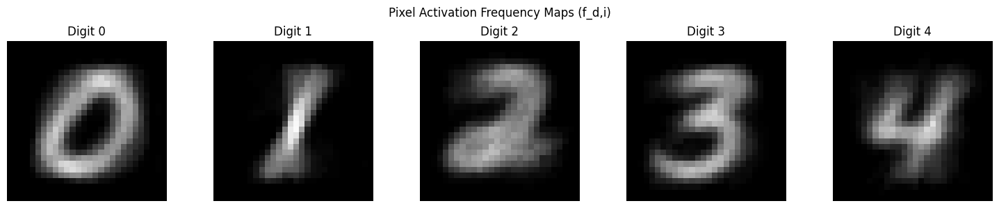


Digit-dominant pixels (format: digit -> [pixel indices]):
Digit 0: [265, 329, 384]
Digit 3: [376, 404]


In [ ]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step I - Import Dependencies
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from torchvision import datasets
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from matplotlib import colormaps
from sklearn.metrics import precision_score, recall_score, f1_score
import pandas as pd


#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step II - Select Digits and Constants
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
selected_digits = [0, 1, 2, 3, 4]
samples_per_split = 100
threshold = 128  # for binarization

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step III - Load MNIST Dataset (No Transform)
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
raw_mnist = datasets.MNIST(root='./data', train=True, download=True, transform=None)

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step IV - Extract 100 Training + 100 Testing Samples per Digit
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
digit_train = defaultdict(list)
digit_test = defaultdict(list)

for img, label in raw_mnist:
    if label in selected_digits:
        if len(digit_train[label]) < samples_per_split:
            digit_train[label].append(np.array(img))
        elif len(digit_test[label]) < samples_per_split:
            digit_test[label].append(np.array(img))

    if all(len(digit_train[d]) == samples_per_split and len(digit_test[d]) == samples_per_split for d in selected_digits):
        break

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step V - Binarize the Images (Train and Test)
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
def binarize(img_list):
    return [(img > threshold).astype(int) for img in img_list]

digit_train_bin = {d: binarize(imgs) for d, imgs in digit_train.items()}
digit_test_bin = {d: binarize(imgs) for d, imgs in digit_test.items()}

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step VI - Flatten and Stack All Data into Arrays
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
X_train, y_train, X_test, y_test = [], [], [], []

for d in selected_digits:
    for img in digit_train_bin[d]:
        X_train.append(img.flatten())
        y_train.append(d)
    for img in digit_test_bin[d]:
        X_test.append(img.flatten())
        y_test.append(d)

X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape:  {X_test.shape}, y_test shape:  {y_test.shape}")

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step VII - Compute Pixel Activation Frequencies f_d,i per Digit
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
f_matrix = np.zeros((len(selected_digits), X_train.shape[1]))  # shape (5, 784)

for idx, digit in enumerate(selected_digits):
    # Get only images of this digit
    digit_images = X_train[y_train == digit]
    # Compute frequency per pixel
    f_matrix[idx] = np.mean(digit_images, axis=0)

print(f"Pixel activation frequency matrix shape: {f_matrix.shape}")

#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step VII.a - Visualize Activation Frequencies as Images
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
fig, axs = plt.subplots(1, len(selected_digits), figsize=(15, 3))

for idx, digit in enumerate(selected_digits):
    ax = axs[idx]
    ax.imshow(f_matrix[idx].reshape(28, 28), cmap='gray', vmin=0, vmax=1)
    ax.set_title(f"Digit {digit}")
    ax.axis('off')

plt.suptitle("Pixel Activation Frequency Maps (f_d,i)")
plt.tight_layout()
plt.show()


#-------------------------------------------------------------------------------------------------------------------------------------------------------------
# Step VIII - Identify Digit-Dominant Pixels
#-------------------------------------------------------------------------------------------------------------------------------------------------------------
dominant_pixels = defaultdict(list)

for d in range(len(selected_digits)):
    for i in range(f_matrix.shape[1]):
        if f_matrix[d, i] > 0.65 and all(f_matrix[other_d, i] < 0.4 for other_d in range(len(selected_digits)) if other_d != d):
            dominant_pixels[selected_digits[d]].append(i)

# Show results
print("\nDigit-dominant pixels (format: digit -> [pixel indices]):")
for digit, pixels in dominant_pixels.items():
**    print(f"Digit {digit}: {pixels}")

**Pixel-Wise Digit Separability Analysis**

> **(1) Single-Pixel Hyperplane**
> * **Slide 36**

In [ ]:
print(f"\n--- Per-Pixel Classification for All Digits with Dominant Pixels ---\n")
print(f"{'Digit':>5}  {'Pixel':>7}  {'Accuracy':>9}  {'F1 Score':>9}  {'Hyperplane Condition'}")
print("-" * 70)

for digit in selected_digits:
    if not dominant_pixels[digit]:
        continue  # Skip if no dominant pixels

    y_true = (y_test == digit).astype(int)
    results = []

    for pixel_index in dominant_pixels[digit]:
        y_pred = (X_test[:, pixel_index] > 0.5).astype(int)
        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred, zero_division=0)
        condition = f"x_{pixel_index} > 0.5"
        results.append((digit, pixel_index, acc, f1, condition))

    # Sort results for this digit by F1
    results.sort(key=lambda x: x[3], reverse=True)

    # Print each row
    for digit, pixel, acc, f1, condition in results:
        print(f"{digit:>5}  {pixel:>7}  {acc:>9.3f}  {f1:>9.3f}  {condition}")


--- Per-Pixel Classification for All Digits with Dominant Pixels ---

Digit    Pixel   Accuracy   F1 Score  Hyperplane Condition
----------------------------------------------------------------------
    0      329      0.878      0.681  x_329 > 0.5
    0      384      0.796      0.528  x_384 > 0.5
    0      265      0.760      0.528  x_265 > 0.5
    3      376      0.770      0.538  x_376 > 0.5
    3      404      0.680      0.416  x_404 > 0.5


> **(2) Logical Combination (AND/OR)**
> * **Slide 37**

In [ ]:
results = []

for digit in selected_digits:
    pixels = dominant_pixels.get(digit, [])
    if not pixels:
        continue
    x_vals = X_test[:, pixels]
    y_true = (y_test == digit).astype(int)

    for rule in ["any", "all"]:
        if rule == "any":
            y_pred = np.any(x_vals > 0.5, axis=1).astype(int)
            condition = " OR ".join([f"x_{i} > 0.5" for i in pixels])
        else:
            y_pred = np.all(x_vals > 0.5, axis=1).astype(int)
            condition = " AND ".join([f"x_{i} > 0.5" for i in pixels])

        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred, zero_division=0)

        results.append((digit, rule, acc, f1, condition))

print(f"\n--- Logical Rule Classification using Dominant Pixels ---\n")
print(f"{'Digit':>5}  {'Rule':>5}  {'Accuracy':>9}  {'F1 Score':>9}       {'Hyperplane Condition'}")
print("-" * 80)
for digit, rule, acc, f1, condition in results:
    print(f"{digit:>5}  {rule:>5}  {acc:>9.3f}  {f1:>9.3f}       {condition}")



--- Logical Rule Classification using Dominant Pixels ---

Digit   Rule   Accuracy   F1 Score       Hyperplane Condition
--------------------------------------------------------------------------------
    0    any      0.714      0.557       x_265 > 0.5 OR x_329 > 0.5 OR x_384 > 0.5
    0    all      0.860      0.500       x_265 > 0.5 AND x_329 > 0.5 AND x_384 > 0.5
    3    any      0.680      0.474       x_376 > 0.5 OR x_404 > 0.5
    3    all      0.770      0.475       x_376 > 0.5 AND x_404 > 0.5


> **(3) Weighted Average (Linear Hyperplane)**
> * **Slide 38**

In [ ]:
results = []

for digit in selected_digits:
    pixels = dominant_pixels.get(digit, [])
    if not pixels:
        continue
    avg_activation = np.mean(X_test[:, pixels], axis=1)
    y_pred = (avg_activation > 0.5).astype(int)
    y_true = (y_test == digit).astype(int)

    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    # Define hyperplane condition string
    k = len(pixels)
    condition = f"(1/{k}) * sum(x_i for i in S) > 0.5  ⇔  sum(x_i) > {k/2:.1f}"

    results.append((digit, acc, f1, condition))

print(f"\n--- Weighted Average Classification using Dominant Pixels ---\n")
print(f"{'Digit':>5}  {'Accuracy':>9}  {'F1 Score':>9}  {'Hyperplane Condition'}")
print("-" * 70)
for digit, acc, f1, condition in results:
    print(f"{digit:>5}  {acc:>9.3f}  {f1:>9.3f}  {condition}")



--- Weighted Average Classification using Dominant Pixels ---

Digit   Accuracy   F1 Score  Hyperplane Condition
----------------------------------------------------------------------
    0      0.860      0.646  (1/3) * sum(x_i for i in S) > 0.5  ⇔  sum(x_i) > 1.5
    3      0.770      0.475  (1/2) * sum(x_i for i in S) > 0.5  ⇔  sum(x_i) > 1.0


## **Experiment No.2 - Questions and Remarks**
## **(Slide 39)**

### Regarding **“Visualizing the Data Changing Through The Layers”:**
- **No major questions, I followed your suggestion on how to order the plots, and how to bring the data down to 2D via PCA and I have provided some other types of data projections I thought would be insightful.**  
- <span style="color:red">**One remark**</span> I would like to make is that the results captured don’t always occur, but I tried to screenshot the most useful result after running the code multiple times. <span style="color:red">**I would like help in better understanding these results, what they mean, and how to move forward.**</span>

---

### Regarding **“Implementation with Synthetic Data”:**
- **This section was relatively new for me, so <span style="color:red">could you please help with verifying that the different types of synthetic data I created are accurate?</span>**  
- **I ran the full code involving training and calculating the cumulative parameters, and there was a major tradeoff between accuracy and surjectivity. <span style="color:red">Could you please review this section and let me know what changes I have to make?</span>**

---

### Regarding **“Hyperplane Separation”:**
- **As this section was experimental, I first tried implementing what Professor Chen explained (the basic version) to make sure I understood the code and the structure. Then, I tried playing around with MNIST data with actual training and testing splits, and I was left wondering, <span style="color:red">how can I accurately project a hyperplane from a super-high dimension to 2D via PCA</span>.**  
**<span style="color:red">I tried this out and there seems to be something wrong as shown in the images of slide 33; while the accuracy of the hyperplane is 1.00, the hyperplane is projected to separate digits incorrectly.</span>**
